### Cargando librerias

In [2]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import geopandas as gpd
from sklearn.preprocessing import StandardScaler, MinMaxScaler


### Contexto y motivacion
Dentro de una sociedad y de la organizacion de un Estado, se necesita la existen-
cia de servicios básicos  que cubran las distintas necesidades de los habitantes.
Por lo tanto, es fundamental una organizacion territorial coherente con la densi-
dad poblacional de cada sector dentro del paıs. Debido a la constante demanda
dentro de los servicios de salud, es que se busca hacer una recolección y análisis
de las instituciones que los componen y su distribución a través de Chile.
Según ”El Diario El Mostrador” en 2022 había  50 zonas rurales dentro de
Chile que no contaban con farmacias en sus localidades. Teniendo que viajar
horas para conseguir medicamentos. Dejando a más de 300.000 personas afec-
tadas.

Sucede algo similar con aquellos poblados alejados de las ciudades, donde se
debe viajar para obtener una atencion m ́edica que incluso no se asegura, tenga
el centro especializado. Por ejemplo, segun un reportaje de 24hrs en plena pan-
demia. Por esta distribucion territorial de los servicios, habitantes como los de
la isla Tenglo deb ́ıan cruzar a Puerto montt para lograr acceso.
Con el trasfondo de conocer sus ubicaciones actuales y cu ́anta centralizacion
hay en acceso a estas dentro de cada zona,es que se busca hacer un panorama
general de la distribución de los servicios de salud a lo largo del país.

Finalmente, este proyecto está dirigido a aquellas autoridades o personas
involucradas en elaboraci ́on de polıticas públicas y dirección general de la con-
trucción de establecimientos médicos. Considerando así también a las munic-
ipalidades de cada localidad y aquellos sujetos pertinenetes en la toma de de-
cisiones de construcción dentro del Ministerio de Salud. Aunque incluso, tiene
su relavancia para el público  general y la adquisición  de conocimiento respecto
a la situación país de la distribución de aquellos centros y farmacias que ellos
mismos pueden necesitar.




### Preguntas objetivo
1. ¿En qué región  y comuna se encuentra la mayor y la menor concentraci ́on
de servicios médicos?
2. ¿Hay alguna comuna y/o región que no tenga un establecimientos de todos
los tipos de complejidad y tipo de emergencia?
3. ¿Cuál es la distribución bumérica y territorial de las farmacias actualmente a lo largo de Chile?
4. ¿Cuál es la distribbución de servicios médicos privados y públicos en Chile?
5. ¿Al agrupar los hospitales por coordenadas todos estos grupos tienen cada tipo de servicio según complejidad? 



### Cargando datos y limpieza

In [35]:
df_censo = pd.read_csv("./database/Cantidad_de_Personas_por_Sexo_y_Edad.csv", sep=";")
df_farmacias = pd.read_csv("./database/farmacias_chile.csv", sep=";", encoding="utf-8")
df_hospitales = pd.read_excel("./database/Establecimientos_DEIS_MINSAL_03_11_2023.xlsx", sheet_name="Establecimientos Vigentes")

def modificar_nombre_columna(nombre: str):
    nombre = nombre.strip()  
    nombre = nombre.lower() 
    nombre = nombre.replace(" ", "_")
    nombre = nombre.replace("\xa0", "_")
    return nombre

nuevos_nombres = {columna: modificar_nombre_columna(columna) for columna in df_censo.columns}
df_censo.rename(columns=nuevos_nombres, inplace=True) # Renombrar columnas del dataframe del censo

df_censo["código_región"] = pd.to_numeric(df_censo["código_región"], errors="coerce")  # Poner el tipo de dato correcto a cada columna
df_censo["código_provincia"] = pd.to_numeric(df_censo["código_provincia"], errors="coerce")
df_censo["código_comuna"] = pd.to_numeric(df_censo["código_comuna"], errors="coerce")
df_censo["edad"] = df_censo["edad"].astype("category")
df_censo["hombres"] = df_censo["hombres"].str.replace(".", "").astype("int")
df_censo["mujeres"] = df_censo["mujeres"].str.replace(".", "").astype("int")
df_censo["total"] = df_censo["total"].str.replace(".", "").astype("int")

df_hospitales.columns = df_hospitales.loc[0,:] # La primera fila tenai los nombres de las columnas
df_hospitales.drop(0, inplace=True)
df_hospitales.drop(columns=["Código Antiguo ", "Código  Madre Antiguo", "Código Madre Nuevo", "Código  Madre Antiguo", "Fecha de Incorporación a la base o cambios", "Teléfono", "Fecha Inicio Funcionamiento", "Vía", "Certificación ", "Número", "Dirección", "Clasificcion Tipo de SAPU", "Dependencia Administrativa"], inplace=True)
# Borro las columnas que no necesitamos

In [36]:
df_hospitales.loc[:,"Tipo de Urgencia "] = df_hospitales.loc[:,"Tipo de Urgencia "].str.replace("ambulatoria", "Ambulatoria") #normlaizamos el nombre de ambulatoria

df_hospitales.replace(["No Aplica", "Pendiente", "Completar", "No Aplica", "Por confirmar", "no Aplica", "Pendiente", "no aplica", "No Aplica"], np.NaN, inplace=True) # Todos las expresions de que no hay informacion lo llevamos a NaN

df_hospitales["Código Vigente"] = df_hospitales["Código Vigente"].astype("int") #Ponemos el tipo de datos correcto
df_hospitales["Código Región"] = df_hospitales["Código Región"].astype("int")

df_hospitales["Código Dependencia Jerárquica (SEREMI / Servicio de Salud)"] = df_hospitales["Código Dependencia Jerárquica (SEREMI / Servicio de Salud)"].astype("float")

df_hospitales["Pertenencia al SNSS"] = df_hospitales["Pertenencia al SNSS"].map(lambda x: x == 'Perteneciente' or x == True) #Cambiamos el dato a bool
df_hospitales["Pertenencia al SNSS"] = df_hospitales["Pertenencia al SNSS"].astype("bool")


df_hospitales["Tiene Servicio de Urgencia"] = df_hospitales["Tiene Servicio de Urgencia"].map(lambda x: x == 'SI' or x == True) # Cambiamos el dato a bool
df_hospitales["Tiene Servicio de Urgencia"] = df_hospitales["Tiene Servicio de Urgencia"].astype("bool")

df_hospitales["Nivel de Atención"] = df_hospitales["Nivel de Atención"].astype("category") # las columnas con datos categoricos las convertimos a category
df_hospitales["Tipo de Urgencia "] = df_hospitales["Tipo de Urgencia "].astype("category")
df_hospitales["Tipo de Prestador Sistema de Salud"] = df_hospitales["Tipo de Prestador Sistema de Salud"].astype("category")
df_hospitales["Nivel de Complejidad"] = df_hospitales["Nivel de Complejidad"].astype("category")
df_hospitales["Tipo de Atención "] = df_hospitales["Tipo de Atención "].astype("category")

df_hospitales = df_hospitales[df_hospitales['Estado de Funcionamiento'].str.contains("Vigente", case=False, na=False)] #Cambiamos el funcionamiento a bool
df_hospitales.drop(columns="Estado de Funcionamiento", inplace=True) # Los centros de salud que ya no esten en funcionamiento los borramos

In [37]:

nuevos_nombres = {columna: modificar_nombre_columna(columna) for columna in df_hospitales.columns}
df_hospitales.rename(columns=nuevos_nombres, inplace=True)
df_hospitales.rename(columns={"latitud______[grados_decimales]": "latitud", "longitud_[grados_decimales]":"longitud"}, inplace=True) #Renombramos columnas

df_hospitales["código_región"] = df_hospitales["código_región"].astype("int") # Cambiamos el tipo de dato
df_hospitales["código_comuna"] = df_hospitales["código_comuna"].astype("int")
df_hospitales["nombre_comuna"] = df_hospitales["nombre_comuna"].str.upper()
df_hospitales["tipo_establecimiento_(unidad)"] = df_hospitales["tipo_establecimiento_(unidad)"].str.strip()

df_hospitales.loc[df_hospitales["nombre_región"] == "Región De los Ríos", "nombre_región"] = "Región De Los Ríos" # Las comunas con datos erronios los cambiamos
df_hospitales.loc[df_hospitales["nombre_comuna"] == "CHILLÁN ", "nombre_comuna"] = "CHILLÁN"
df_hospitales.loc[df_hospitales["nombre_comuna"] == "LICANTEN", "nombre_comuna"] = "LICANTÉN"
df_hospitales.loc[df_hospitales["nombre_comuna"] == "VICHUQUEN", "nombre_comuna"] = "VICHUQUÉN"
df_hospitales.loc[df_hospitales["nombre_comuna"] == "CALERA","nombre_comuna"] = "LA CALERA"
df_hospitales.loc[df_hospitales["nombre_comuna"] == "LAS CONDES", "código_comuna"] = 13114
df_hospitales.loc[df_hospitales["nombre_comuna"] == "LA FLORIDA", "código_comuna"] = 13110



In [38]:
# El censo no tiene el Ñuble por lo que lo vamos agregar nosotros

comunas_ñuble = {16109: 'YUNGAY',
 16105: 'PEMUCO',
 16104: 'EL CARMEN',
 16107: 'QUILLÓN',
 16108: 'SAN IGNACIO',
 16106: 'PINTO',
 16102: 'BULNES',
 16302: 'COIHUECO',
 16103: 'CHILLÁN VIEJO',
 16206: 'RÁNQUIL',
 16304: 'SAN FABIÁN',
 16101: 'CHILLÁN',
 16205: 'PORTEZUELO',
 16203: 'COELEMU',
 16305: 'SAN NICOLÁS',
 16301: 'SAN CARLOS',
 16207: 'TREGUACO',
 16204: 'NINHUE',
 16303: 'ÑIQUÉN',
 16201: 'QUIRIHUE',
 16202: 'COBQUECURA'}

comunas_ñuble = {v: k for k, v in comunas_ñuble.items()}


provincias_ñuble = {
    161: "DIGUILLÍN",
    162: "ITATA",
    163: "PUNILLA"
}


In [39]:
# Obtenemos los datos que sean del Ñuble y cambiamos sus codigos
d = df_censo[df_censo["nombre_provincia"].str.contains("ÑUBLE")]
d.loc[:, "nombre_comuna"] = d["nombre_comuna"].str.replace(" *", "")
d.loc[:, "código_comuna"] = d["nombre_comuna"].map(comunas_ñuble).astype("string")
d.loc[:, "nombre_región"] = "ÑUBLE"
d.loc[:, "código_región"] = 16
d.loc[:, "código_provincia"] = d["código_comuna"].str.slice(0,3)
d.loc[:, "código_provincia"] = d["código_provincia"].astype("int")
d.loc[:, "nombre_provincia"] = d["código_provincia"].map(provincias_ñuble)

In [40]:
# Borramos la parte de las comunas del Ñuble y agregamos el Nuevo dataframe que tiene los datos de Ñuble correctos
df_censo.drop(df_censo[df_censo["nombre_provincia"].str.contains("ÑUBLE")].index, inplace=True)
df_censo = pd.concat([df_censo, d], ignore_index=True)
df_censo.sort_values(by="orden", inplace=True)
df_censo["código_comuna"] = df_censo["código_comuna"].astype("float")


# Agregamos el codigo provincia a los hospitales
codigo_comuna_a_provincia = dict(zip(df_censo['código_comuna'], df_censo['código_provincia']))
codigo_comuna_a_provincia = {int(comuna): int(provincia) for comuna, provincia in codigo_comuna_a_provincia.items() if not pd.isna(comuna)}
df_hospitales.loc[:, "código_provincia"] = df_hospitales["código_comuna"].map(codigo_comuna_a_provincia)
df_hospitales["código_provincia"] = df_hospitales["código_provincia"].astype("int")

# Agregamos el nombre de la provincia a los hospitales
codigo_comuna_a_nombre_provincia = dict(zip(df_censo['código_comuna'], df_censo['nombre_provincia']))
codigo_comuna_a_nombre_provincia = {int(comuna): str(provincia) for comuna, provincia in codigo_comuna_a_nombre_provincia.items() if not pd.isna(comuna)}
df_hospitales.loc[:, "nombre_provincia"] = df_hospitales["código_comuna"].map(codigo_comuna_a_nombre_provincia)


# Creo un dict de codigo comuna a codigo region
codigo_comuna_a_codigo_region = dict(zip(df_censo['código_comuna'], df_censo['código_región']))
codigo_comuna_a_codigo_region = {int(comuna): int(provincia) for comuna, provincia in codigo_comuna_a_codigo_region.items() if not pd.isna(comuna)}


In [41]:
# Los nombres de los comunas no coinciden con los del censo asi que lo hicimos a mano
nombre_comuna_a_codigo_comuna = {'ARICA': 15101, 'CAMARONES': 15102, 'PUTRE': 15201, 'GENERAL LAGOS': 15202, 'IQUIQUE': 1101, 'ALTO HOSPICIO': 1107, 'POZO ALMONTE': 1401, 'CAMIÑA': 1402, 'CAMINA': 1402, 'COLCHANE': 1403, 'HUARA': 1404, 'PICA': 1405, 'ANTOFAGASTA': 2101, 'MEJILLONES': 2102, 'SIERRA GORDA': 2103, 'TALTAL': 2104, 'CALAMA': 2201, 'OLLAGÜE': 2202, 'OLLAGUE': 2202, 'SAN PEDRO DE ATACAMA': 2203, 'TOCOPILLA': 2301, 'MARÍA ELENA': 2302, 'MARIA ELENA': 2302, 'COPIAPÓ': 3101, 'COPIAPO': 3101, 'CALDERA': 3102, 'TIERRA AMARILLA': 3103, 'CHAÑARAL': 3201, 'CHANARAL': 3201, 'DIEGO DE ALMAGRO': 3202, 'VALLENAR': 3301, 'ALTO DEL CARMEN': 3302, 'FREIRINA': 3303, 'HUASCO': 3304, 'LA SERENA': 4101, 'COQUIMBO': 4102, 'ANDACOLLO': 4103, 'LA HIGUERA': 4104, 'PAIGUANO': 4105, 'VICUÑA': 4106, 'VICUNA': 4106, 'ILLAPEL': 4201, 'CANELA': 4202, 'LOS VILOS': 4203, 'SALAMANCA': 4204, 'OVALLE': 4301, 'COMBARBALÁ': 4302, 'COMBARBALA': 4302, 'MONTE PATRIA': 4303, 'PUNITAQUI': 4304, 'RÍO HURTADO': 4305, 'RIO HURTADO': 4305, 'VALPARAÍSO': 5101, 'VALPARAISO': 5101, 'CASABLANCA': 5102, 'CONCÓN': 5103, 'CONCON': 5103, 'JUAN FERNÁNDEZ': 5104, 'JUAN FERNANDEZ': 5104, 'PUCHUNCAVÍ': 5105, 'PUCHUNCAVI': 5105, 'QUINTERO': 5107, 'VIÑA DEL MAR': 5109, 'VINA DEL MAR': 5109, 'ISLA DE PASCUA': 5201, 'LOS ANDES': 5301, 'CALLE LARGA': 5302, 'RINCONADA': 5303, 'SAN ESTEBAN': 5304, 'LA LIGUA': 5401, 'CABILDO': 5402, 'PAPUDO': 5403, 'PETORCA': 5404, 'ZAPALLAR': 5405, 'QUILLOTA': 5501, 'CALERA': 5502, 'LA CALERA': 5502, 'HIJUELAS': 5503, 'LA CRUZ': 5504, 'NOGALES': 5506, 'SAN ANTONIO': 5601, 'ALGARROBO': 5602, 'CARTAGENA': 5603, 'EL QUISCO': 5604, 'EL TABO': 5605, 'SANTO DOMINGO': 5606, 'SAN FELIPE': 5701, 'CATEMU': 5702, 'LLAILLAY': 5703, 'PANQUEHUE': 5704, 'PUTAENDO': 5705, 'SANTA MARÍA': 5706, 'SANTA MARIA': 5706, 'QUILPUÉ': 5801, 'QUILPUE': 5801, 'LIMACHE': 5802, 'OLMUÉ': 5803, 'OLMUE': 5803, 'VILLA ALEMANA': 5804, 'SANTIAGO': 13101, 'CERRILLOS': 13102, 'CERRO NAVIA': 13103, 'CONCHALÍ': 13104, 'CONCHALI': 13104, 'EL BOSQUE': 13105, 'ESTACIÓN CENTRAL': 13106, 'ESTACION CENTRAL': 13106, 'HUECHURABA': 13107, 'INDEPENDENCIA': 13108, 'LA CISTERNA': 13109, 'LA FLORIDA': 13110, 'LA GRANJA': 13111, 'LA PINTANA': 13112, 'LA REINA': 13113, 'LAS CONDES': 13114, 'LO BARNECHEA': 13115, 'LO ESPEJO': 13116, 'LO PRADO': 13117, 'MACUL': 13118, 'MAIPÚ': 13119, 'MAIPU': 13119, 'ÑUÑOA': 13120, 'NUNOA': 13120, 'PEDRO AGUIRRE CERDA': 13121, 'PEÑALOLÉN': 13122, 'PENALOLEN': 13122, 'PROVIDENCIA': 13123, 'PUDAHUEL': 13124, 'QUILICURA': 13125, 'QUINTA NORMAL': 13126, 'RECOLETA': 13127, 'RENCA': 13128, 'SAN JOAQUÍN': 13129, 'SAN JOAQUIN': 13129, 'SAN MIGUEL': 13130, 'SAN RAMÓN': 13131, 'SAN RAMON': 13131, 'VITACURA': 13132, 'PUENTE ALTO': 13201, 'PIRQUE': 13202, 'SAN JOSÉ DE MAIPO': 13203, 'SAN JOSE DE MAIPO': 13203, 'COLINA': 13301, 'LAMPA': 13302, 'TILTIL': 13303, 'TIL-TIL': 13303, 'SAN BERNARDO': 13401, 'BUIN': 13402, 'CALERA DE TANGO': 13403, 'PAINE': 13404, 'MELIPILLA': 13501, 'ALHUÉ': 13502, 'ALHUE': 13502, 'CURACAVÍ': 13503, 'CURACAVI': 13503, 'MARÍA PINTO': 13504, 'MARIA PINTO': 13504, 'SAN PEDRO': 13505, 'TALAGANTE': 13601, 'EL MONTE': 13602, 'ISLA DE MAIPO': 13603, 'PADRE HURTADO': 13604, 'PEÑAFLOR': 13605, 'PENAFLOR': 13605, 'RANCAGUA': 6101, 'CODEGUA': 6102, 'COINCO': 6103, 'COLTAUCO': 6104, 'DOÑIHUE': 6105, 'DONIHUE': 6105, 'GRANEROS': 6106, 'LAS CABRAS': 6107, 'MACHALÍ': 6108, 'MACHALI': 6108, 'MALLOA': 6109, 'MOSTAZAL': 6110, 'OLIVAR': 6111, 'PEUMO': 6112, 'PICHIDEGUA': 6113, 'QUINTA DE TILCOCO': 6114, 'RENGO': 6115, 'REQUÍNOA': 6116, 'REQUINOA': 6116, 'SAN VICENTE': 6117, 'PICHILEMU': 6201, 'LA ESTRELLA': 6202, 'LITUECHE': 6203, 'MARCHIHUE': 6204, 'NAVIDAD': 6205, 'PAREDONES': 6206, 'SAN FERNANDO': 6301, 'CHÉPICA': 6302, 'CHEPICA': 6302, 'CHIMBARONGO': 6303, 'LOLOL': 6304, 'NANCAGUA': 6305, 'PALMILLA': 6306, 'PERALILLO': 6307, 'PLACILLA': 6308, 'PUMANQUE': 6309, 'SANTA CRUZ': 6310, 'TALCA': 7101, 'CONSTITUCIÓN': 7102, 'CONSTITUCION': 7102, 'CUREPTO': 7103, 'EMPEDRADO': 7104, 'MAULE': 7105, 'PELARCO': 7106, 'PENCAHUE': 7107, 'RÍO CLARO': 7108, 'RIO CLARO': 7108, 'SAN CLEMENTE': 7109, 'SAN RAFAEL': 7110, 'CAUQUENES': 7201, 'CHANCO': 7202, 'PELLUHUE': 7203, 'CURICÓ': 7301, 'CURICO': 7301, 'HUALAÑÉ': 7302, 'HUALANE': 7302, 'LICANTÉN': 7303, 'LICANTEN': 7303, 'MOLINA': 7304, 'RAUCO': 7305, 'ROMERAL': 7306, 'SAGRADA FAMILIA': 7307, 'TENO': 7308, 'VICHUQUÉN': 7309, 'VICHUQUEN': 7309, 'LINARES': 7401, 'COLBÚN': 7402, 'COLBUN': 7402, 'LONGAVÍ': 7403, 'LONGAVI': 7403, 'PARRAL': 7404, 'RETIRO': 7405, 'SAN JAVIER': 7406, 'VILLA ALEGRE': 7407, 'YERBAS BUENAS': 7408, 'CONCEPCIÓN': 8101, 'CONCEPCION': 8101, 'CORONEL': 8102, 'CHIGUAYANTE': 8103, 'FLORIDA': 8104, 'HUALQUI': 8105, 'LOTA': 8106, 'PENCO': 8107, 'SAN PEDRO DE LA PAZ': 8108, 'SANTA JUANA': 8109, 'TALCAHUANO': 8110, 'TOMÉ': 8111, 'TOME': 8111, 'HUALPÉN': 8112, 'HUALPEN': 8112, 'LEBU': 8201, 'ARAUCO': 8202, 'CAÑETE': 8203, 'CANETE': 8203, 'CONTULMO': 8204, 'CURANILAHUE': 8205, 'LOS ÁLAMOS': 8206, 'LOS ALAMOS': 8206, 'TIRÚA': 8207, 'TIRUA': 8207, 'LOS ÁNGELES': 8301, 'LOS ANGELES': 8301, 'ANTUCO': 8302, 'CABRERO': 8303, 'LAJA': 8304, 'MULCHÉN': 8305, 'MULCHEN': 8305, 'NACIMIENTO': 8306, 'NEGRETE': 8307, 'QUILACO': 8308, 'QUILLECO': 8309, 'SAN ROSENDO': 8310, 'SANTA BÁRBARA': 8311, 'SANTA BARBARA': 8311, 'TUCAPEL': 8312, 'YUMBEL': 8313, 'ALTO BIOBÍO': 8314, 'ALTO BIOBIO': 8314, 'CHILLÁN': 16101, 'CHILLAN': 16101, 'BULNES': 16102, 'COBQUECURA': 16202, 'COELEMU': 16203, 'COIHUECO': 16302, 'CHILLÁN VIEJO': 16103, 'CHILLAN VIEJO': 16103, 'EL CARMEN': 16104, 'NINHUE': 16204, 'ÑIQUÉN': 16303, 'NIQUEN': 16303, 'PEMUCO': 16105, 'PINTO': 16106, 'PORTEZUELO': 16205, 'QUILLÓN': 16107, 'QUILLON': 16107, 'QUIRIHUE': 16201, 'RÁNQUIL': 16206, 'RANQUIL': 16206, 'SAN CARLOS': 16301, 'SAN FABIÁN': 16304, 'SAN FABIAN': 16304, 'SAN IGNACIO': 16108, 'SAN NICOLÁS': 16305, 'SAN NICOLAS': 16305, 'TREGUACO': 16207, 'YUNGAY': 16109, 'TEMUCO': 9101, 'CARAHUE': 9102, 'CUNCO': 9103, 'CURARREHUE': 9104, 'FREIRE': 9105, 'GALVARINO': 9106, 'GORBEA': 9107, 'LAUTARO': 9108, 'LONCOCHE': 9109, 'MELIPEUCO': 9110, 'NUEVA IMPERIAL': 9111, 'PADRE LAS CASAS': 9112, 'PERQUENCO': 9113, 'PITRUFQUÉN': 9114, 'PITRUFQUEN': 9114, 'PUCÓN': 9115, 'PUCON': 9115, 'SAAVEDRA': 9116, 'TEODORO SCHMIDT': 9117, 'TOLTÉN': 9118, 'TOLTEN': 9118, 'VILCÚN': 9119, 'VILCUN': 9119, 'VILLARRICA': 9120, 'CHOLCHOL': 9121, 'ANGOL': 9201, 'COLLIPULLI': 9202, 'CURACAUTÍN': 9203, 'CURACAUTIN': 9203, 'ERCILLA': 9204, 'LONQUIMAY': 9205, 'LOS SAUCES': 9206, 'LUMACO': 9207, 'PURÉN': 9208, 'PUREN': 9208, 'RENAICO': 9209, 'TRAIGUÉN': 9210, 'TRAIGUEN': 9210, 'VICTORIA': 9211, 'VALDIVIA': 14101, 'CORRAL': 14102, 'LANCO': 14103, 'LOS LAGOS': 14104, 'MÁFIL': 14105, 'MAFIL': 14105, 'MARIQUINA': 14106, 'PAILLACO': 14107, 'PANGUIPULLI': 14108, 'LA UNIÓN': 14201, 'LA UNION': 14201, 'FUTRONO': 14202, 'LAGO RANCO': 14203, 'RÍO BUENO': 14204, 'RIO BUENO': 14204, 'PUERTO MONTT': 10101, 'CALBUCO': 10102, 'COCHAMÓ': 10103, 'COCHAMO': 10103, 'FRESIA': 10104, 'FRUTILLAR': 10105, 'LOS MUERMOS': 10106, 'LLANQUIHUE': 10107, 'MAULLÍN': 10108, 'MAULLIN': 10108, 'PUERTO VARAS': 10109, 'CASTRO': 10201, 'ANCUD': 10202, 'CHONCHI': 10203, 'CURACO DE VÉLEZ': 10204, 'CURACO DE VELEZ': 10204, 'DALCAHUE': 10205, 'PUQUELDÓN': 10206, 'PUQUELDON': 10206, 'QUEILÉN': 10207, 'QUEILEN': 10207, 'QUELLÓN': 10208, 'QUELLON': 10208, 'QUEMCHI': 10209, 'QUINCHAO': 10210, 'OSORNO': 10301, 'PUERTO OCTAY': 10302, 'PURRANQUE': 10303, 'PUYEHUE': 10304, 'RÍO NEGRO': 10305, 'RIO NEGRO': 10305, 'SAN JUAN DE LA COSTA': 10306, 'SAN PABLO': 10307, 'CHAITÉN': 10401, 'CHAITEN': 10401, 'FUTALEUFÚ': 10402, 'FUTALEUFU': 10402, 'HUALAIHUÉ': 10403, 'HUALAIHUE': 10403, 'PALENA': 10404, 'COYHAIQUE': 11101, 'LAGO VERDE': 11102, 'AYSÉN': 11201, 'AYSEN': 11201, 'CISNES': 11202, 'GUAITECAS': 11203, 'COCHRANE': 11301, "O'HIGGINS": 11302, 'TORTEL': 11303, 'CHILE CHICO': 11401, 'RÍO IBÁÑEZ': 11402, 'RIO IBANEZ': 11402, 'PUNTA ARENAS': 12101, 'LAGUNA BLANCA': 12102, 'RÍO VERDE': 12103, 'RIO VERDE': 12103, 'SAN GREGORIO': 12104, 'CABO DE HORNOS': 12201, 'ANTÁRTICA': 12202, 'ANTARTICA': 12202, 'PORVENIR': 12301, 'PRIMAVERA': 12302, 'TIMAUKEL': 12303, 'NATALES': 12401, 'TORRES DEL PAINE': 12402, 'SAN FRANCISCO DE MOSTAZAL': 6110, 'ALTO BIO BIO': 8314, 'PUERTO NATALES': 12401, 'LLAY LLAY': 5703, 'MARCHIGUE': 6204, 'CHOL CHOL': 9121, 'PAIHUANO': 4105}

In [42]:
#Agrego el codigo comuna
df_farmacias.loc[:,"código_comuna"] = df_farmacias.loc[:,"Comuna"].str.replace("Ñ", "N").map(nombre_comuna_a_codigo_comuna) 
#Con los dict anteriores de los codigos comunas paso a los codigos de provincia y region
df_farmacias.loc[:,"código_provincia"] = df_farmacias.loc[:,"código_comuna"].map(codigo_comuna_a_provincia)
df_farmacias.loc[:,"código_región"] = df_farmacias.loc[:,"código_comuna"].map(codigo_comuna_a_codigo_region)


df_farmacias.dropna(subset="Comuna", inplace=True) 
# Hay dos farmacias que no tenian comuna pues faltaban en la base de datos, como estan en santigo la parte con mas farmacias no provocaria ningun cambio en el analicis por lo que lo borramos

#Cambio el nombre de las columnas de df de las farmacias
nuevos_nombres = {columna: modificar_nombre_columna(columna) for columna in df_farmacias.columns}
df_farmacias.rename(columns=nuevos_nombres, inplace=True)

#Cambio el tipo de dato al correcto
df_farmacias["código_comuna"] = df_farmacias["código_comuna"].astype("int")
df_farmacias["latitud"] = pd.to_numeric(df_farmacias['latitud'], errors='coerce')
df_farmacias["longitud"] = pd.to_numeric(df_farmacias['longitud'], errors='coerce')

### Pregunta 01: ¿En que region y comuna se encuentra la mayor y la menor concentracion de servicios ḿedicos?


In [542]:
df_hospitales_1 = df_hospitales[(~df_hospitales["tipo_de_prestador_sistema_de_salud"].isin(['Fuerzas Armadas y de Orden', 'Institución Medicina Legal']))]
df_hospitales_1 = df_hospitales_1[~df_hospitales_1["tipo_de_prestador_sistema_de_salud"].isna()]
df_hospitales_1 = df_hospitales_1[(~df_hospitales_1["ámbito_de_funcionamiento"].isin(['Hospital',
 'Posta de Salud Rural (PSR)',
 'Centro Comunitario de Salud Familiar (CECOSF)',
 'Servicio de Atención Primaria de Urgencia de Alta Resolutividad (SAR)',
 'Centro de Salud Familiar (CESFAM)',
 'Centro de Salud Privado',
 'Unidad de Salud Funcionarios',
 'Dirección Servicio de Salud',
 'Servicio de Atención Primaria de Urgencia (SAPU)',
 'Clínica',
 'Consultorio General Urbano  (CGU)',
 'Unidad de Procedimientos Móvil',
 'Servicio de Urgencia Rural (SUR)',
 'Centro de Diagnóstico y Terapeútico (CDT)',
 'Hospital de Día Infanto Adolescente',
 'Consultorio General Rural (CGR)',
 'Centro de Referencia de Salud (CRS)',
 'Centro Corporación para la Nutrición Infantil (CONIN)',
 'Hospital de Dia Adulto',
 'Puesto de Atención Médica Especializado (PAME) Incorporado por Crisis Sanitaria',
 'Centro de Especialidad',
 'Centros Exclusivos de Atención Respiratoria (CEAR)',
 'Especialidades  Primarias',
 'Centro de Regulación Médica de las Urgencias (SAMU)',
 'Centros de Diagnóstico y Tratamiento Privados',
 'Policlínico Funcionarios (Minería)',
 'Centro de Especialidades Primarias',
 'Centro Radiológico',
 'Centro de Salud']))]
df_hospitales_1["tipo_de_prestador_sistema_de_salud"] = df_hospitales_1["tipo_de_prestador_sistema_de_salud"].astype("str")
df_hospitales_1["tipo_de_prestador_sistema_de_salud"] = df_hospitales_1["tipo_de_prestador_sistema_de_salud"].astype("category")


In [543]:
df_poblacion = df_censo[df_censo["nombre_comuna"] != "PAÍS"]
df_poblacion_por_comuna = df_poblacion[df_poblacion["edad"] == "Total Comunal"]
df_poblacion_por_provincia = pd.pivot_table(df_poblacion_por_comuna, index="código_provincia", values=["hombres", "mujeres", "total"], aggfunc=np.sum)
df_poblacion_por_region = pd.pivot_table(df_poblacion_por_comuna, index=["código_región", "nombre_región"], values=["hombres", "mujeres", "total"], aggfunc=np.sum)


¿Existen comunas sin servicios de salud?

In [544]:
comunas_con_centros_de_salud = df_hospitales_1["código_comuna"].unique()
todas_las_comunas = df_poblacion_por_comuna["código_comuna"].unique()

#resto todas las comunas a las comunas con centros de salud
resultado = np.setdiff1d(todas_las_comunas, comunas_con_centros_de_salud)
df_poblacion_por_comuna[df_poblacion_por_comuna["código_comuna"].isin(resultado)]



,orden,nombre_región,código_región,nombre_provincia,código_provincia,nombre_comuna,código_comuna,edad,hombres,mujeres,total
7040,7502,MAGALLANES Y DE LA ANTÁRTICA CHILENA,12.0,ANTÁRTICA CHILENA,122.0,ANTÁRTICA,12202.0,Total Comunal,126,12,138


In [545]:
len(df_hospitales_1)

4382

¿Como se distribuye la cantidad de servicios?

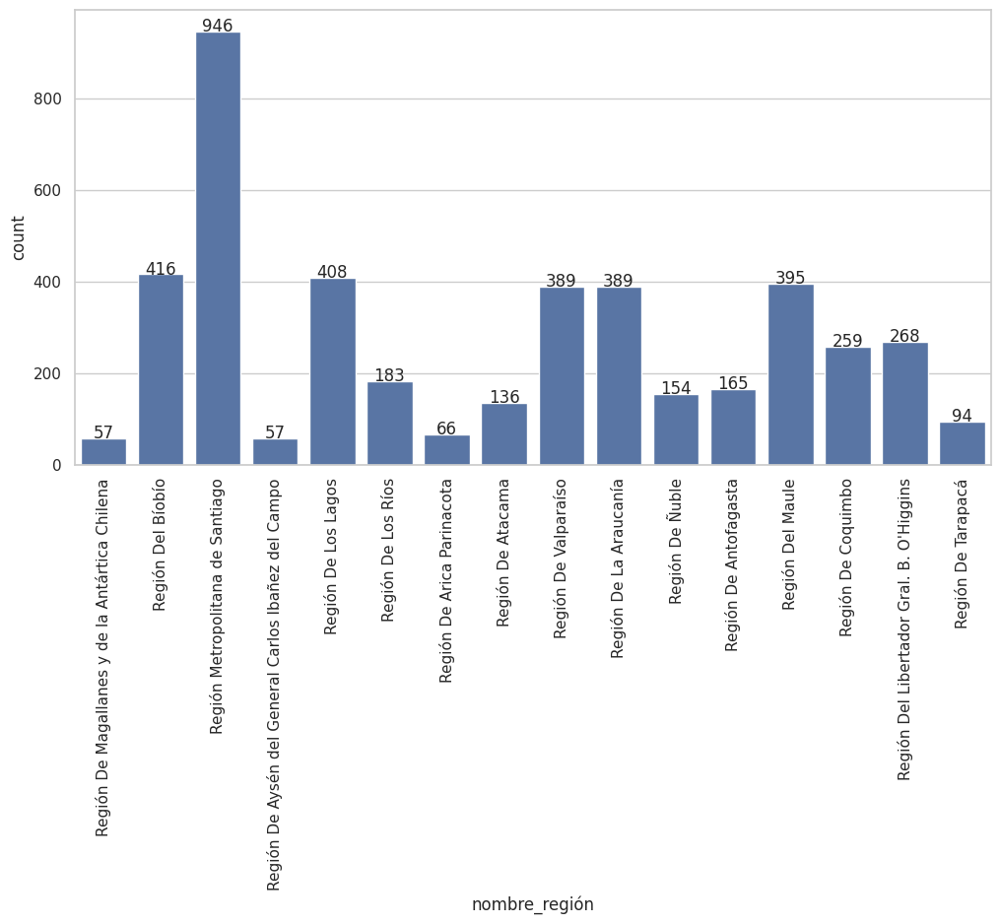

In [546]:
plt.figure(figsize=(12, 6))
ax = sns.countplot(x="nombre_región", data=df_hospitales_1, color = "purple")
for p in ax.patches:
    ax.annotate(f'{int(p.get_height())}', (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='baseline')
plt.xticks(rotation=90)
plt.show()

In [43]:
plt.figure(figsize=(21, 6))
ax = sns.countplot(x="nombre_provincia", data=df_hospitales_1, color = "purple")
for p in ax.patches:
    ax.annotate(f'{int(p.get_height())}', (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='baseline')
plt.xticks(rotation=90)
plt.show()

NameError: name 'df_hospitales_1' is not defined

<Figure size 2100x600 with 0 Axes>

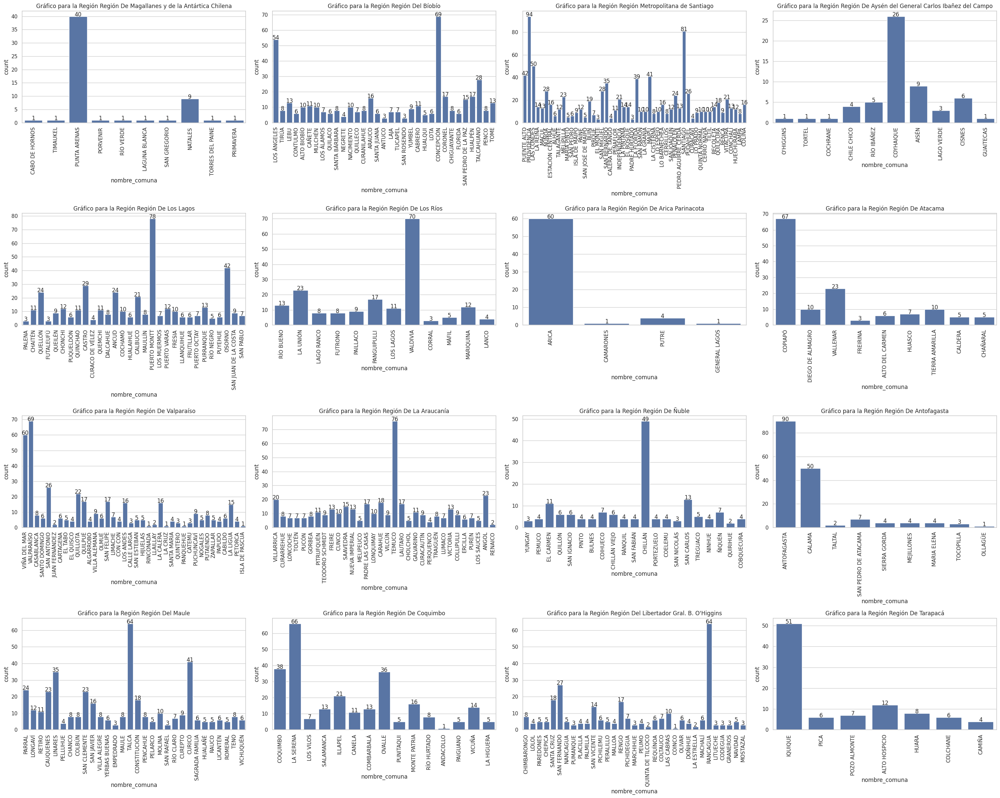

In [548]:
regiones_unicas = df_hospitales_1['nombre_región'].unique()

# Calcula el número de filas y columnas necesarias para mostrar todos los gráficos
num_regiones = len(regiones_unicas)
num_filas = (num_regiones + 3) // 4  # Divide y redondea hacia arriba

# Establece el tamaño de la figura en función del número de filas
plt.figure(figsize=(30, 6 * num_filas))

# Itera a través de las regiones y crea un gráfico para cada una
for i, region in enumerate(regiones_unicas, 1):
    # Crea el subgráfico correspondiente
    plt.subplot(num_filas, 4, i)
    
    # Crea el gráfico de barras
    ax = sns.countplot(x="nombre_comuna", data=df_hospitales_1[df_hospitales_1['nombre_región'] == region],color = "pink")
    
    # Añade etiquetas y título
    for p in ax.patches:
        ax.annotate(f'{int(p.get_height())}', (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='baseline')
    plt.title(f'Gráfico para la Región {region}')
    plt.xticks(rotation=90)

# Ajusta el diseño para evitar superposiciones
plt.tight_layout()

Se puede ver que las comunas con mas hospitales tiene mas poblacion

#### Relacion entre poblacion y cantidad de hospitales

In [550]:
df_poblacion_por_comuna.columns


Index(['orden', 'nombre_región', 'código_región', 'nombre_provincia',
       'código_provincia', 'nombre_comuna', 'código_comuna', 'edad', 'hombres',
       'mujeres', 'total'],
      dtype='object')

In [551]:
df_hospitales_poblacion_comuna = pd.merge(on="código_comuna", left=df_hospitales_1, right=df_poblacion_por_comuna[["código_comuna", "total"]], how="right")
conteo = df_hospitales_poblacion_comuna['código_comuna'].value_counts()
df_hospitales_poblacion_comuna['hospitales_x_comuna'] = df_hospitales_poblacion_comuna['código_comuna'].map(conteo)
df_hospitales_poblacion_comuna.drop_duplicates(subset="código_comuna", inplace=True)
df_hospitales_poblacion_comuna.head(1)

,código_vigente,código_región,nombre_región,código_dependencia_jerárquica_(seremi_/_servicio_de_salud),nombre_dependencia_jerárquica_(seremi_/_servicio_de_salud),pertenencia_al_snss,tipo_establecimiento_(unidad),ámbito_de_funcionamiento,nombre_oficial,nivel_de_atención,...,tipo_de_urgencia,latitud,longitud,tipo_de_prestador_sistema_de_salud,nivel_de_complejidad,tipo_de_atención,código_provincia,nombre_provincia,total,hospitales_x_comuna
0,200585.0,15.0,Región De Arica Parinacota,15.0,SEREMI De Arica y Parinacota,False,Clínica Dental,Establecimiento de Salud,Centro de Especialidades Odontológicas del Nor...,NaN,...,NaN,-18.482842,-70.307282,Privado,Mediana Complejidad,Atención Abierta-Ambulatoria,151.0,ARICA,221364,60


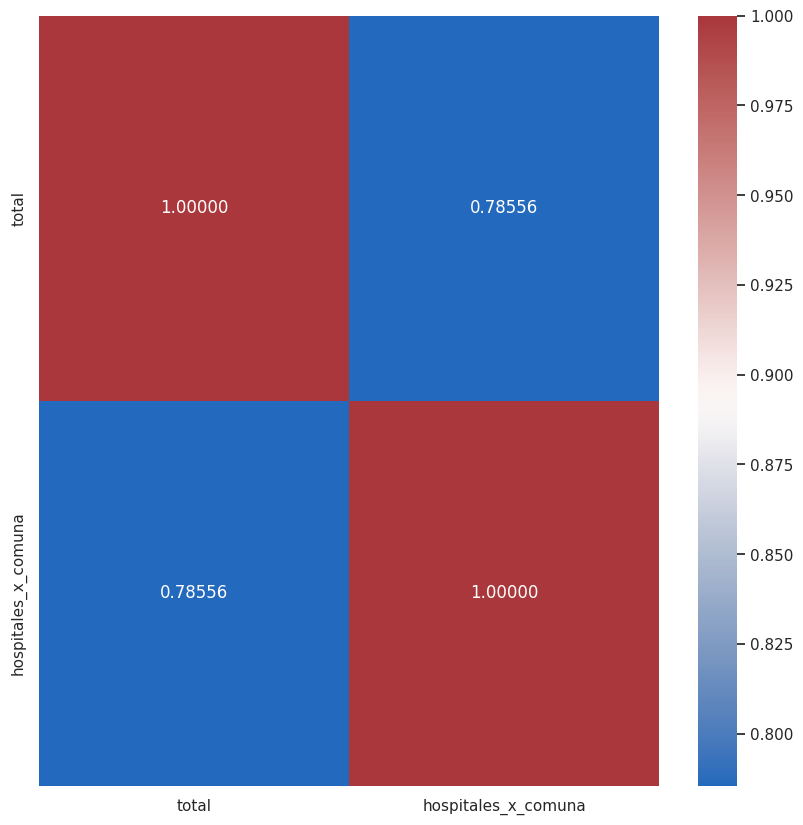

In [552]:
plt.figure(figsize=(10, 10))

correlation_matrix = df_hospitales_poblacion_comuna[["total", "hospitales_x_comuna"]].corr().round(5)

sns.heatmap(correlation_matrix, annot=True,  fmt=".5f", cmap="PuRd")

plt.show()

In [589]:
df_hospitales_poblacion_comuna.columns

Index(['código_vigente', 'código_región', 'nombre_región',
       'código_dependencia_jerárquica_(seremi_/_servicio_de_salud)',
       'nombre_dependencia_jerárquica_(seremi_/_servicio_de_salud)',
       'pertenencia_al_snss', 'tipo_establecimiento_(unidad)',
       'ámbito_de_funcionamiento', 'nombre_oficial', 'nivel_de_atención',
       'código_comuna', 'nombre_comuna', 'tiene_servicio_de_urgencia',
       'tipo_de_urgencia', 'latitud', 'longitud',
       'tipo_de_prestador_sistema_de_salud', 'nivel_de_complejidad',
       'tipo_de_atención', 'código_provincia', 'nombre_provincia', 'total',
       'hospitales_x_comuna'],
      dtype='object')

Existe un correlacion alta entre total de personas y cantidad de hospitales

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


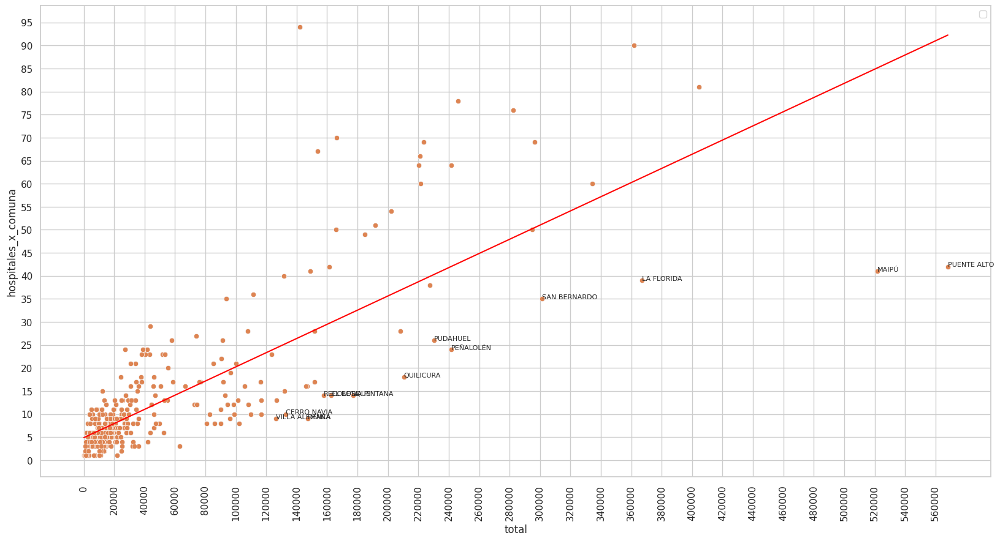

In [591]:
import numpy as np

plt.figure(figsize=(20, 10))
ax = sns.scatterplot(x=df_hospitales_poblacion_comuna["total"], y=df_hospitales_poblacion_comuna["hospitales_x_comuna"])

coefficients = np.polyfit(df_hospitales_poblacion_comuna["total"], df_hospitales_poblacion_comuna["hospitales_x_comuna"], 1)
polynomial = np.poly1d(coefficients)
x_values = np.linspace(min(df_hospitales_poblacion_comuna["total"]), max(df_hospitales_poblacion_comuna["total"]), 100)
y_values = polynomial(x_values)

sns.scatterplot(x = "total", y = "hospitales_x_comuna", data=df_hospitales_poblacion_comuna,color = "pink")
sns.lineplot(x=x_values, y=y_values, color='purple')

distancia = 13

for i, txt in enumerate(df_hospitales_poblacion_comuna["nombre_comuna"].unique()):
    d = -1*(df_hospitales_poblacion_comuna["hospitales_x_comuna"].iloc[i] - polynomial(df_hospitales_poblacion_comuna["total"].iloc[i]))
    if d > distancia:
        ax.annotate(txt, (df_hospitales_poblacion_comuna["total"].iloc[i], df_hospitales_poblacion_comuna["hospitales_x_comuna"].iloc[i]), fontsize=8)


plt.yticks(range(0, max(df_hospitales_poblacion_comuna["hospitales_x_comuna"]) + 5, 5))
plt.xticks(range(0, max(df_hospitales_poblacion_comuna["total"]) + 10_000, 20_000), rotation=90)

plt.xticks(rotation=90)
plt.legend() 
plt.show()


In [553]:
df_km2 = pd.read_csv("../database/tabla_wikipedia.csv")
df_km2.drop(columns="Unnamed: 2", inplace=True)
nuevos_nombres = {columna: modificar_nombre_columna(columna) for columna in df_km2.columns}
df_km2.rename(columns=nuevos_nombres, inplace=True)
df_km2 = df_km2[["superficie_(km²)", "cut_(código_único_territorial)"]]
df_km2["superficie_(km²)"] = df_km2["superficie_(km²)"].str.replace(".", "").str.replace(",", ".").astype("float")
df_km2

,superficie_(km²),cut_(código_único_territorial)
0,4799.4,15101
1,3927.0,15102
2,5902.5,15201
3,2244.4,15202
4,2242.1,1101
...,...,...
341,126.0,13601
342,118.0,13602
343,189.0,13603
344,808.0,13604


In [554]:
# df_hospitales_poblacion_comuna["densidad"] = df_hospitales_poblacion_comuna["hospitales_x_comuna"] / (df_hospitales_poblacion_comuna["total"] / 10_000)
densidad = df_hospitales_poblacion_comuna
densidad = pd.merge(left_on="código_comuna", right_on="cut_(código_único_territorial)",right=df_km2, left=densidad)

densidad["densidad_hospital_x_poblacion"] = densidad["hospitales_x_comuna"] / densidad["total"]
densidad["densidad_hospital_x_km2"] = densidad["hospitales_x_comuna"] / densidad["superficie_(km²)"]
densidad["densidad_poblacion"] = densidad["total"] / densidad["superficie_(km²)"]
densidad

,código_vigente,código_región,nombre_región,código_dependencia_jerárquica_(seremi_/_servicio_de_salud),nombre_dependencia_jerárquica_(seremi_/_servicio_de_salud),pertenencia_al_snss,tipo_establecimiento_(unidad),ámbito_de_funcionamiento,nombre_oficial,nivel_de_atención,...,tipo_de_atención,código_provincia,nombre_provincia,total,hospitales_x_comuna,superficie_(km²),cut_(código_único_territorial),densidad_hospital_x_poblacion,densidad_hospital_x_km2,densidad_poblacion
0,200585.0,15.0,Región De Arica Parinacota,15.0,SEREMI De Arica y Parinacota,False,Clínica Dental,Establecimiento de Salud,Centro de Especialidades Odontológicas del Nor...,NaN,...,Atención Abierta-Ambulatoria,151.0,ARICA,221364,60,4799.4,15101,0.000271,0.012502,46.123265
1,101406.0,15.0,Región De Arica Parinacota,1.0,Servicio de Salud Arica y Parinacota,True,Posta de Salud Rural (PSR),Establecimiento de Salud,Posta de Salud Rural Codpa,Primario,...,Atención Abierta-Ambulatoria,151.0,ARICA,1255,1,3927.0,15102,0.000797,0.000255,0.319582
2,101407.0,15.0,Región De Arica Parinacota,1.0,Servicio de Salud Arica y Parinacota,True,Posta de Salud Rural (PSR),Establecimiento de Salud,Posta de Salud Rural Ticnamar,Primario,...,Atención Abierta-Ambulatoria,152.0,PARINACOTA,2765,4,5902.5,15201,0.001447,0.000678,0.468446
3,101404.0,15.0,Región De Arica Parinacota,1.0,Servicio de Salud Arica y Parinacota,True,Posta de Salud Rural (PSR),Establecimiento de Salud,Posta de Salud Rural Visviri,Primario,...,Atención Abierta-Ambulatoria,152.0,PARINACOTA,684,1,2244.4,15202,0.001462,0.000446,0.304759
4,200540.0,1.0,Región De Tarapacá,1.0,SEREMI De Tarapacá,False,Clínica Dental,Establecimiento de Salud,Centro Odontológico Uno Salud Dental Iquique,NaN,...,Atención Abierta-Ambulatoria,11.0,IQUIQUE,191468,51,2242.1,1101,0.000266,0.022747,85.396726
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
341,126102.0,12.0,Región De Magallanes y de la Antártica Chilena,26.0,Servicio de Salud Magallanes,True,Hospital,Establecimiento de Salud,Hospital Dr. Marco Antonio Chamorro ( Porvenir),Primario,...,Atención Cerrada-Hospitalaria,123.0,TIERRA DEL FUEGO,6801,1,9707.4,12301,0.000147,0.000103,0.700600
342,201436.0,12.0,Región De Magallanes y de la Antártica Chilena,26.0,Servicio de Salud Magallanes,True,Posta de Salud Rural (PSR),Establecimiento de Salud,Posta Salud Rural Cerro Sombrero,Primario,...,Atención Abierta-Ambulatoria,123.0,TIERRA DEL FUEGO,1158,1,4253.4,12302,0.000864,0.000235,0.272253
343,126412.0,12.0,Región De Magallanes y de la Antártica Chilena,26.0,Servicio de Salud Magallanes,True,Posta de Salud Rural (PSR),Establecimiento de Salud,Posta de Salud Rural Cameron,Primario,...,Atención Abierta-Ambulatoria,123.0,TIERRA DEL FUEGO,405,1,10758.9,12303,0.002469,0.000093,0.037643
344,200472.0,12.0,Región De Magallanes y de la Antártica Chilena,12.0,SEREMI De Magallanes y la Antártica Chilena,False,Laboratorio Clínico,Establecimiento de Salud,Laboratorio Clínico Biohealth,NaN,...,NaN,124.0,ÚLTIMA ESPERANZA,21477,9,49924.1,12401,0.000419,0.000180,0.430193


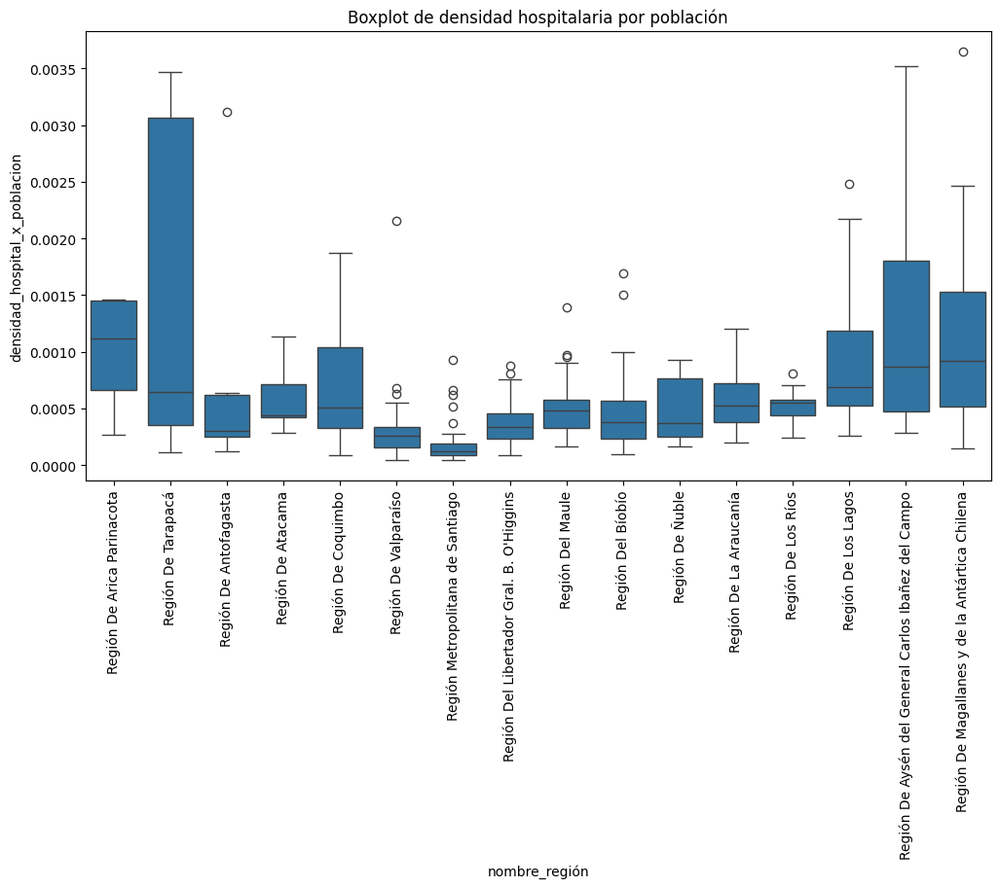

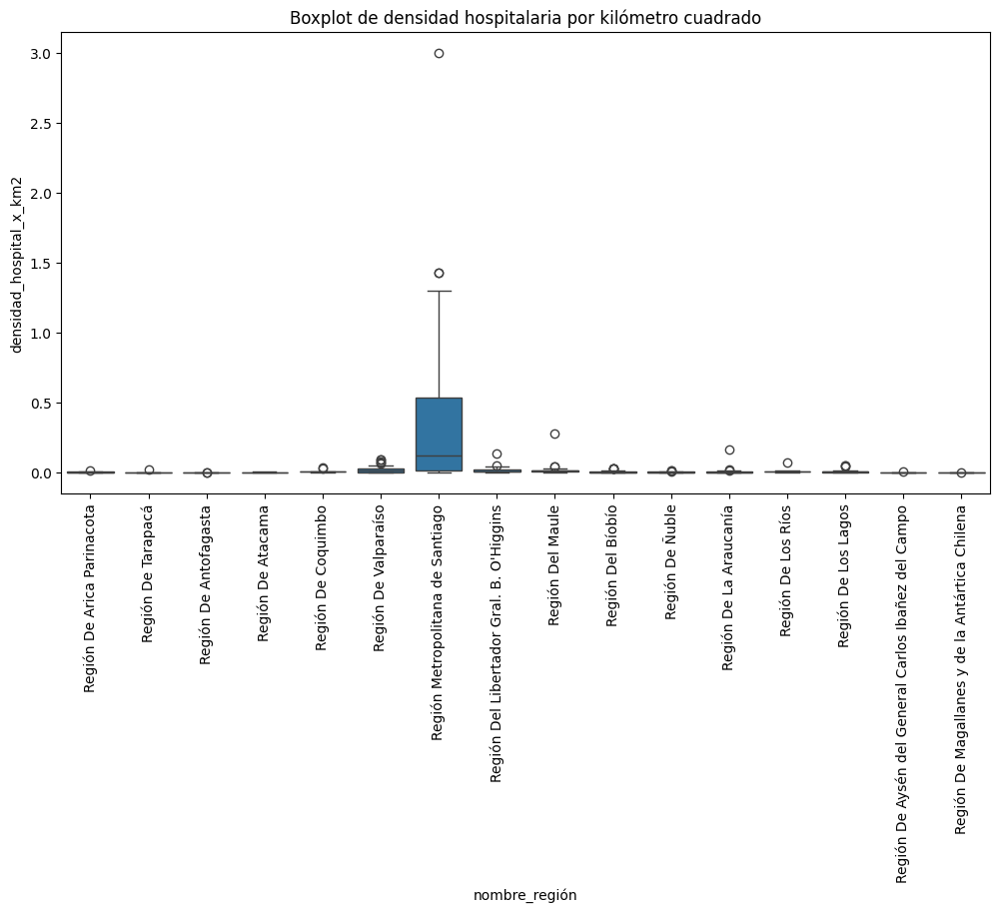

In [93]:
plt.figure(figsize=(12, 6))
sns.boxplot(x="nombre_región", y="densidad_hospital_x_poblacion", data=densidad, color = "pink")
plt.title("Boxplot de densidad hospitalaria por población")
plt.xticks(rotation=90)
plt.show()

plt.figure(figsize=(12, 6))
sns.boxplot(x="nombre_región", y="densidad_hospital_x_km2", data=densidad, color =  "pink")
plt.title("Boxplot de densidad hospitalaria por kilómetro cuadrado")
plt.xticks(rotation=90)

plt.show()



In [3]:
gdf = gpd.read_file('../maps/Comunas.zip')
gdf = pd.merge(left=gdf, right=densidad, left_on="cod_comuna", right_on="código_comuna")
gdf = gdf[(gdf["cod_comuna"] != 5201) & (gdf["cod_comuna"] != 5104)]

scaler = MinMaxScaler()
gdf["densidad_hospital_x_km2_n"] = scaler.fit_transform(gdf[['densidad_hospital_x_km2']])
gdf["densidad_hospital_x_poblacion_n"] = scaler.fit_transform(gdf[['densidad_hospital_x_poblacion']])
gdf["densidad_poblacion_n"] = scaler.fit_transform(gdf[['densidad_poblacion']])
gdf["total_n"] = scaler.fit_transform(gdf[['total']])
gdf["hospitales_x_comuna_n"] = scaler.fit_transform(gdf[['hospitales_x_comuna']])

NameError: name 'densidad' is not defined

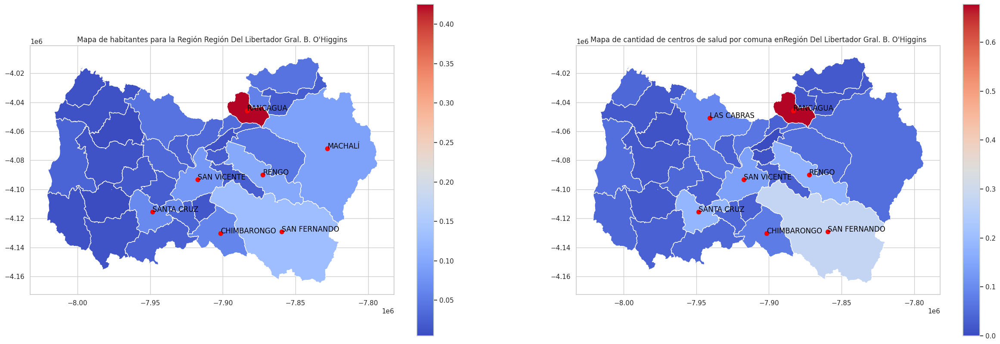

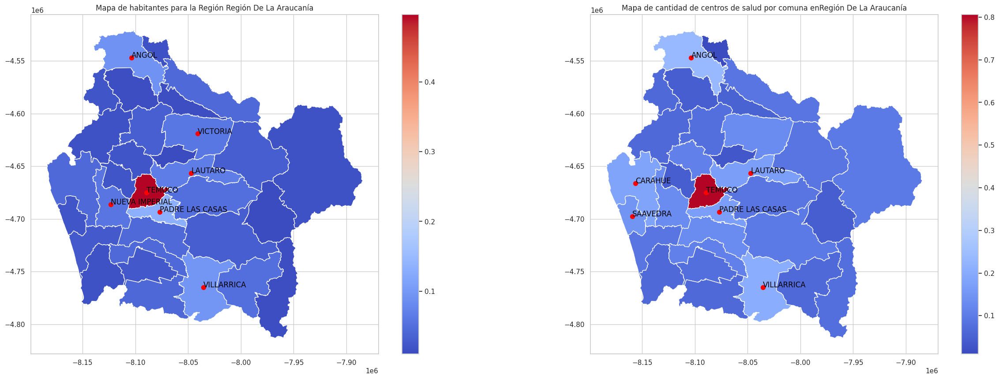

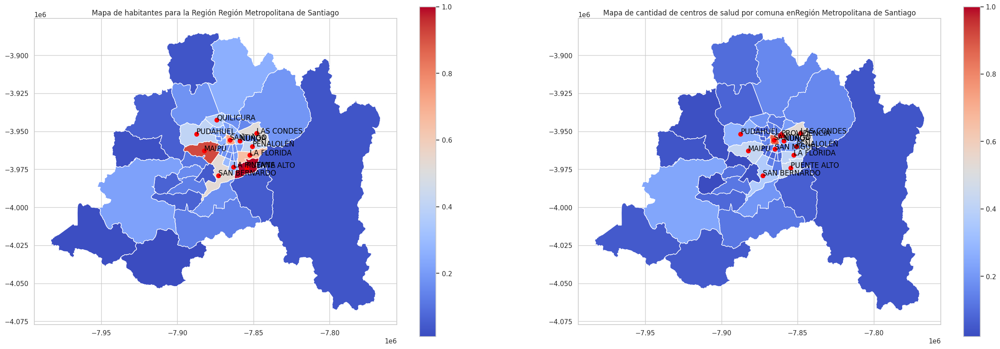

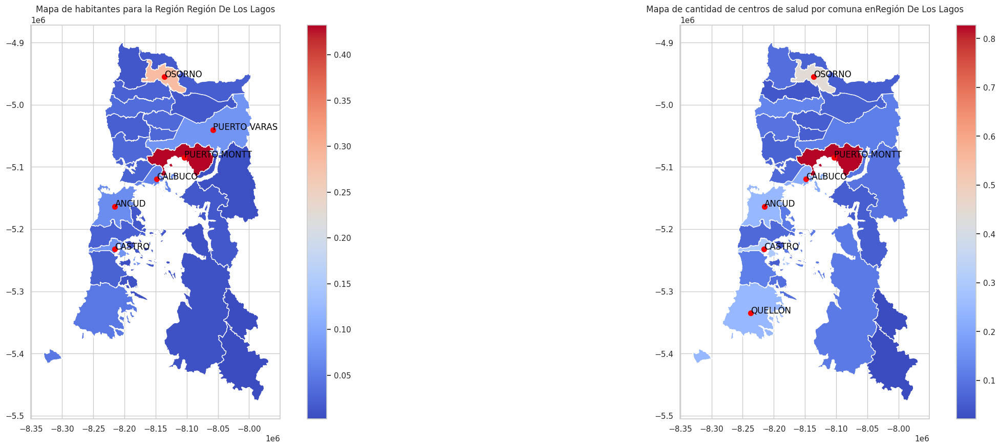

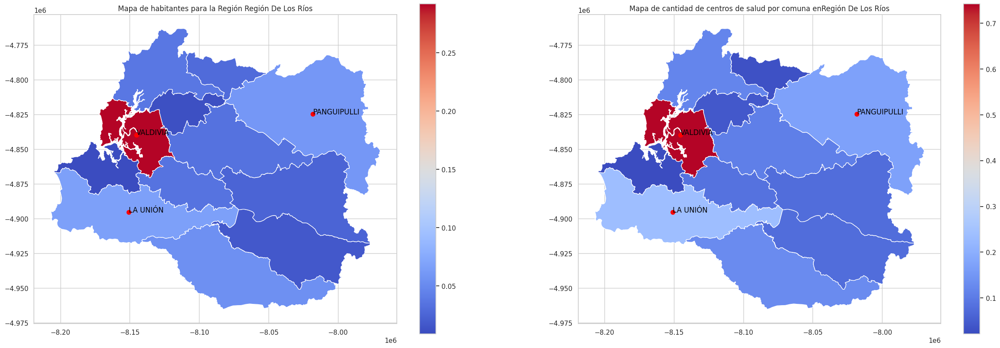

...

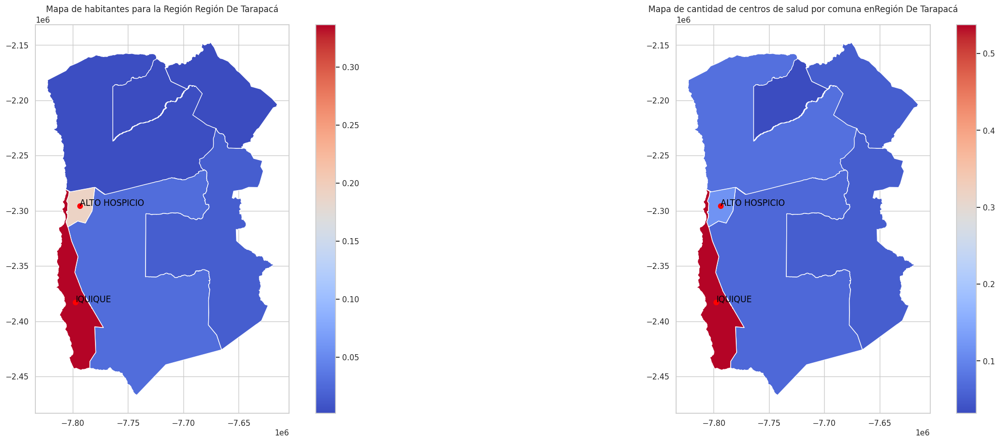

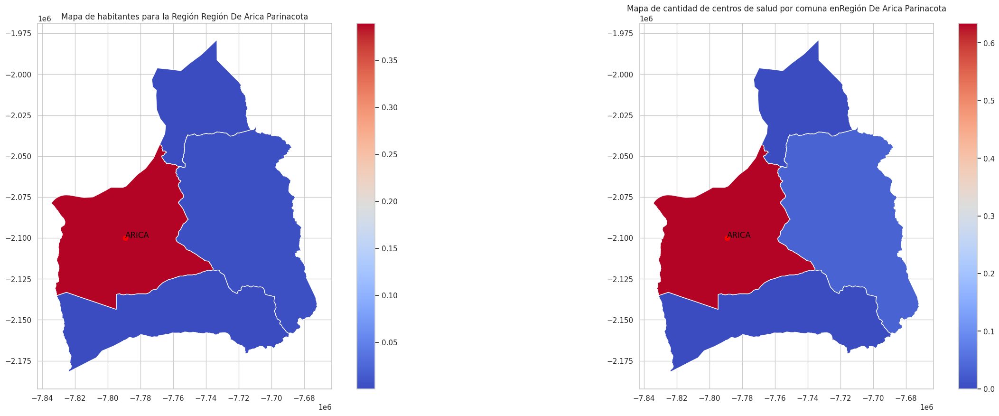

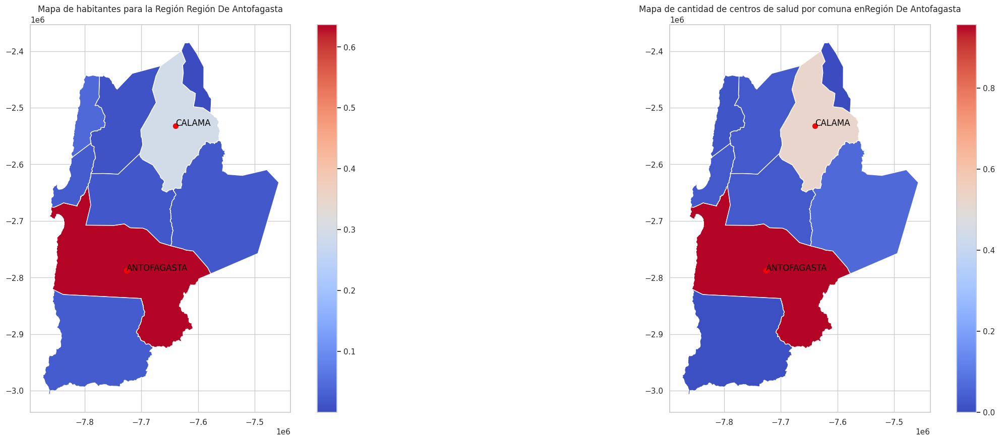

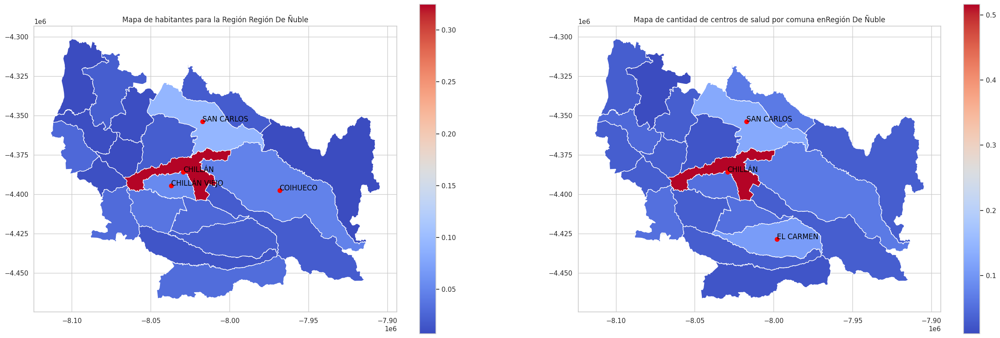

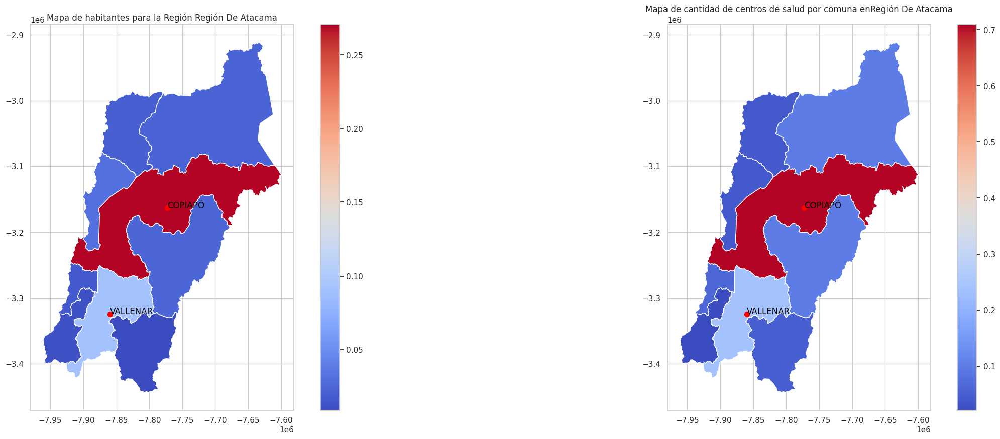

In [575]:
regiones = gdf["nombre_región"].unique()
var_densidad_poblacion_n = "densidad_poblacion_n"
var_densidad_hospitales_n = "densidad_hospital_x_poblacion_n"
var_densidad_hospitales_x_km2_n = "densidad_hospital_x_km2_n"
var_habitantes_totales = "total_n"
var_hospitales_por_comuna = "hospitales_x_comuna_n"
for region in regiones:
    gdf_region = gdf[gdf["nombre_región"] == region]
    
    fig, axs = plt.subplots(1, 2, figsize=(30, 10))

    gdf_region.plot(column=var_habitantes_totales, cmap='coolwarm', legend=True, ax=axs[0])
    
    q_densidad_poblacion = gdf_region[var_habitantes_totales].quantile(0.8)
    gdf_region_filtrada_densidad = gdf_region[gdf_region[var_habitantes_totales] > q_densidad_poblacion]

    for idx, row in gdf_region_filtrada_densidad.iterrows():
        axs[0].scatter(row.geometry.centroid.x, row.geometry.centroid.y, color='red', s=50) 
        axs[0].annotate(text=row["nombre_comuna"], xy=(row.geometry.centroid.x, row.geometry.centroid.y), color='black')

    axs[0].set_title(f'Mapa de habitantes para la Región {region}')


    ####################################################################################################
    
    gdf_region.plot(column=var_hospitales_por_comuna, cmap='coolwarm', legend=True, ax=axs[1])
    
    q_densidad_hospitales = gdf_region[var_hospitales_por_comuna].quantile(0.8)
    gdf_region_filtrada_hospitales = gdf_region[gdf_region[var_hospitales_por_comuna] > q_densidad_hospitales]

    for idx, row in gdf_region_filtrada_hospitales.iterrows():
        axs[1].scatter(row.geometry.centroid.x, row.geometry.centroid.y, color='red', s=50) 
        axs[1].annotate(text=row["nombre_comuna"], xy=(row.geometry.centroid.x, row.geometry.centroid.y), color='black')

    axs[1].set_title(f'Mapa de cantidad de centros de salud por comuna en{region}')

    plt.show()

En la exploracion de datos se observa que en Chile existen 4382 centros de salud, de los cuales la mayor parte se concentran en la region metropolitana y que solo existe un comuna en todo Chile sin centros de salud que es la antartica.
En los mapas de cantidad de hospitales y cantidad de habitantes se puede ver que existe un relacion fuerte entre estas dos variables, siendo esta de 0.79, aunque es importante destacar que si se hace la relacion por densidad como hospitales por habitantes, se dan numeros anomalos pues hay comunas con 6 centros de salud y 1000 habitantes, esto sucede pues aqui no estamos viendo el numero de camas si no que cada centro de salud vale por igual, **sera interesante ver que pasa con la densidad hospital por habitantes con centros de salud de mayor complejidad**.
Tambien se puede visualizar una especie de concentracion de los centros de salud en comunas especificas en cada region

### Pregunta 02: ¿Hay alguna comuna y/o regi ́on que no tenga un establecimientos de todos los tipos de complejidad y tipo de emergencia?

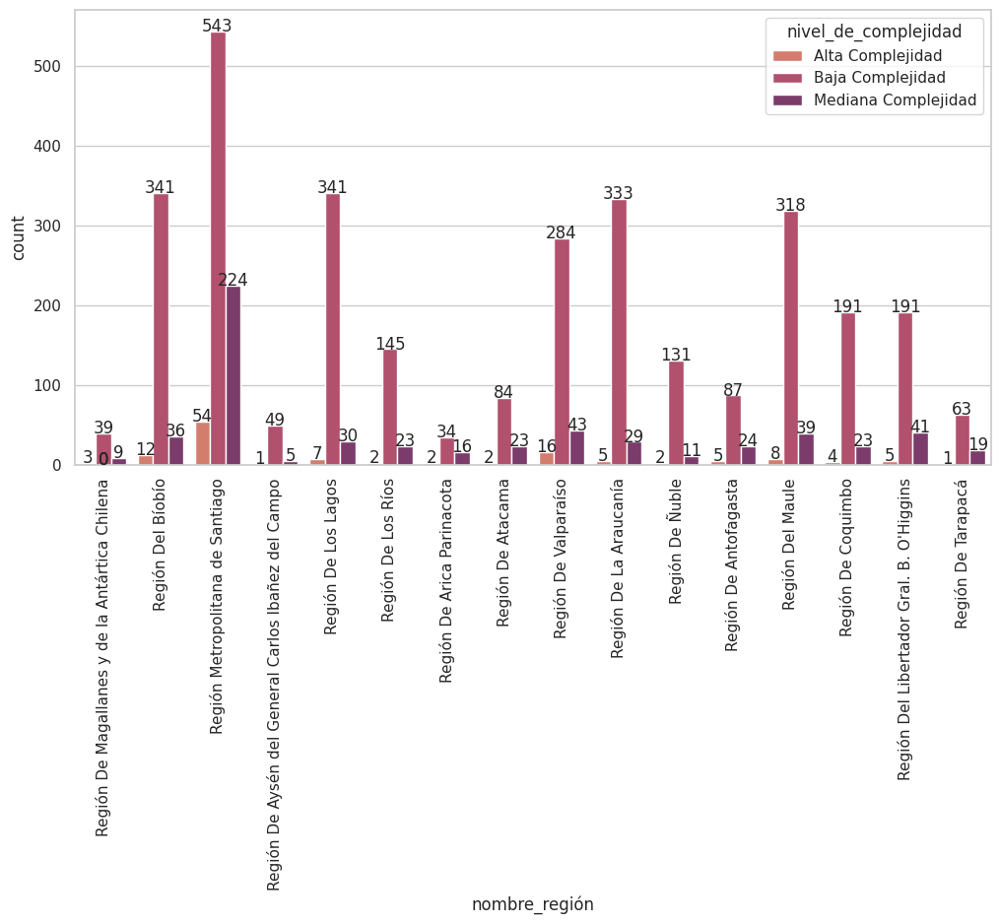

In [104]:
plt.figure(figsize=(12, 6))
ax = sns.countplot(x="nombre_región", data=df_hospitales, hue="nivel_de_complejidad", palette="flare")
for p in ax.patches:
    ax.annotate(f'{int(p.get_height())}', (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='baseline')
plt.xticks(rotation=90)
plt.show()

In [538]:
df_hospitales_1.columns

Index(['código_vigente', 'código_región', 'nombre_región',
       'código_dependencia_jerárquica_(seremi_/_servicio_de_salud)',
       'nombre_dependencia_jerárquica_(seremi_/_servicio_de_salud)',
       'pertenencia_al_snss', 'tipo_establecimiento_(unidad)',
       'ámbito_de_funcionamiento', 'nombre_oficial', 'nivel_de_atención',
       'código_comuna', 'nombre_comuna', 'tiene_servicio_de_urgencia',
       'tipo_de_urgencia', 'latitud', 'longitud',
       'tipo_de_prestador_sistema_de_salud', 'nivel_de_complejidad',
       'tipo_de_atención', 'código_provincia', 'nombre_provincia'],
      dtype='object', name=0)

In [540]:
urgencia_cantidad = df_hospitales_1.groupby("nombre_comuna")["tiene_servicio_de_urgencia"].value_counts().unstack(fill_value=0).reset_index()
nuevos_nombres = {columna: modificar_nombre_columna(str(columna)) for columna in urgencia_cantidad.columns}
urgencia_cantidad.rename(columns=nuevos_nombres, inplace=True)
urgencia_cantidad[urgencia_cantidad["true"] == 0]


tiene_servicio_de_urgencia,nombre_comuna,false,true
23,CAMARONES,1,0
87,ERCILLA,6,0
97,GENERAL LAGOS,1,0
100,GUAITECAS,1,0
117,LA CRUZ,1,0
128,LAGO VERDE,3,0
129,LAGUNA BLANCA,1,0
153,LOS SAUCES,5,0
158,LUMACO,7,0
185,O'HIGGINS,1,0


In [537]:
len(urgencia_cantidad[urgencia_cantidad["true"] == 0]) # si agregamos la Antartica son 26

25

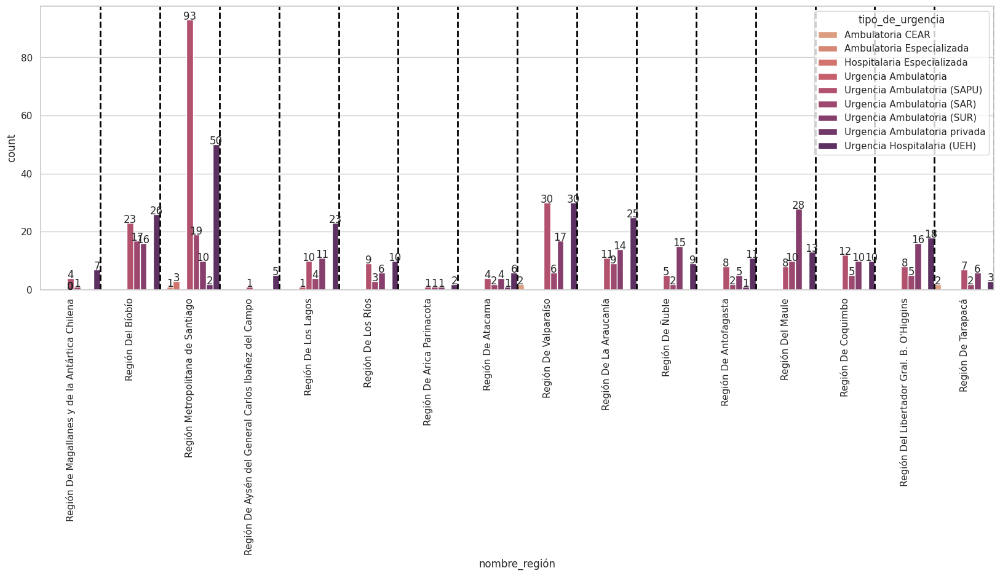

In [468]:
# Supongamos que tu DataFrame se llama 'df_hospitales'
plt.figure(figsize=(20, 6))

# Crear el gráfico de barras
ax = sns.countplot(x="nombre_región", data=df_hospitales, hue="tipo_de_urgencia", palette="flare", width=1)

for p in ax.patches:
    ax.annotate(f'{int(p.get_height())}', (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='baseline')
for x in range(len(df_hospitales['nombre_región'].unique())):
    plt.axvline(x + 0.5, color='black', linestyle='--', linewidth=2)
plt.xticks(rotation=90, ha="center")

plt.show()

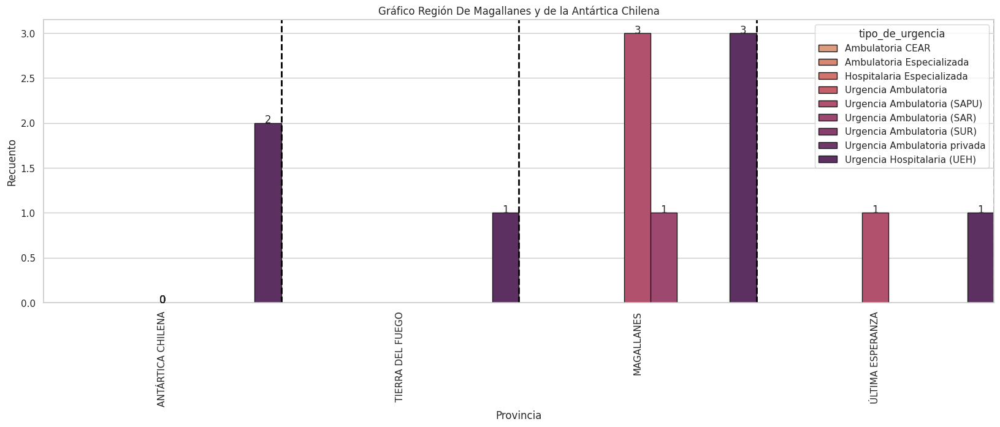

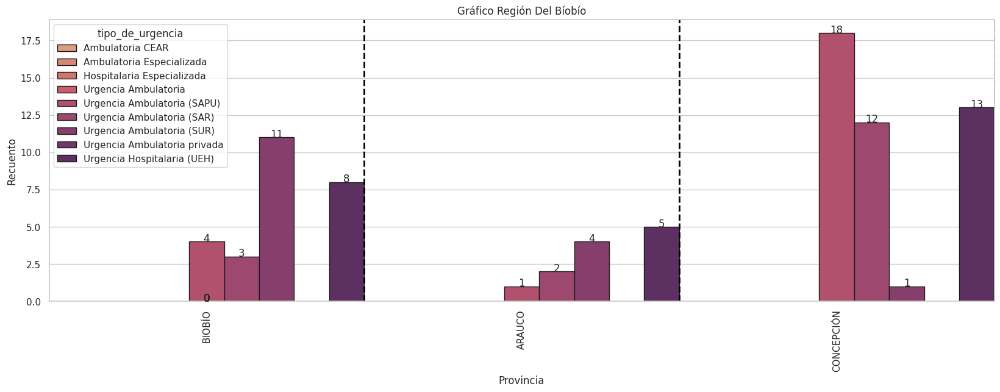

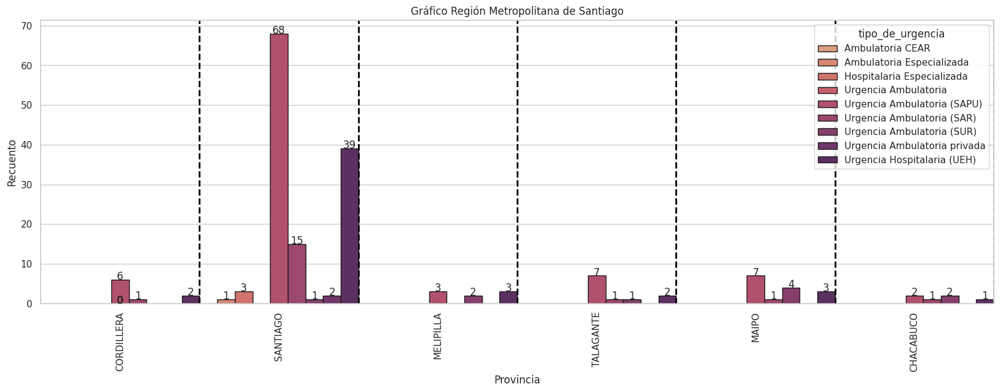

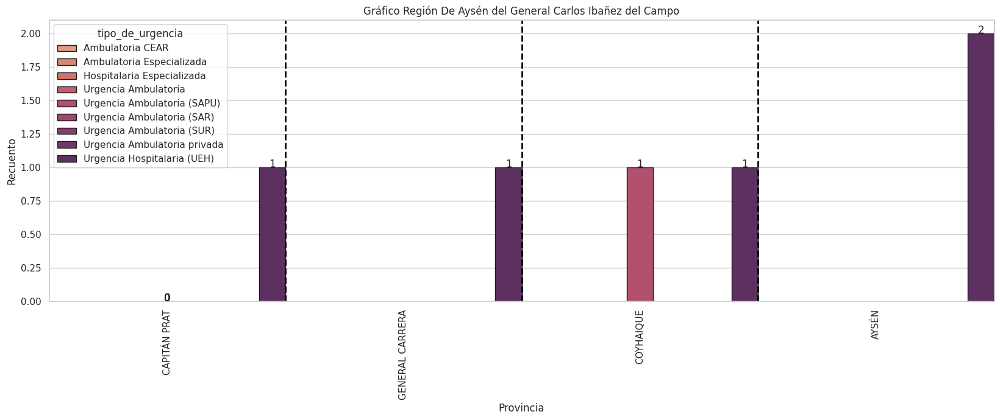

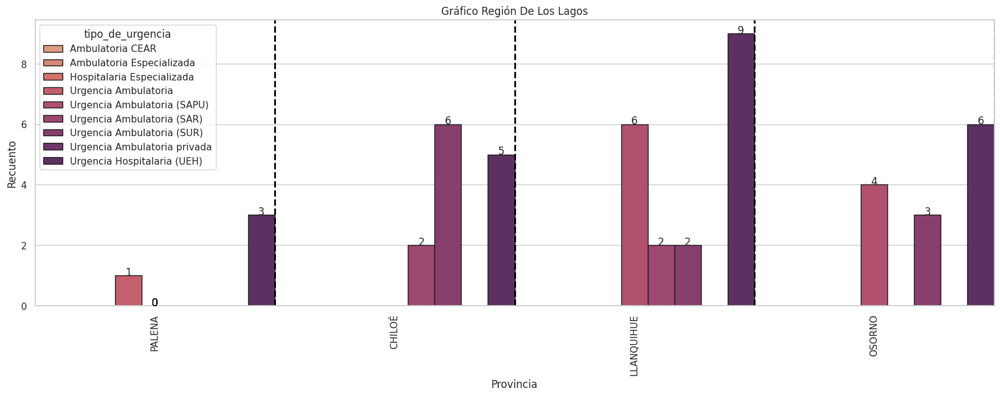

...

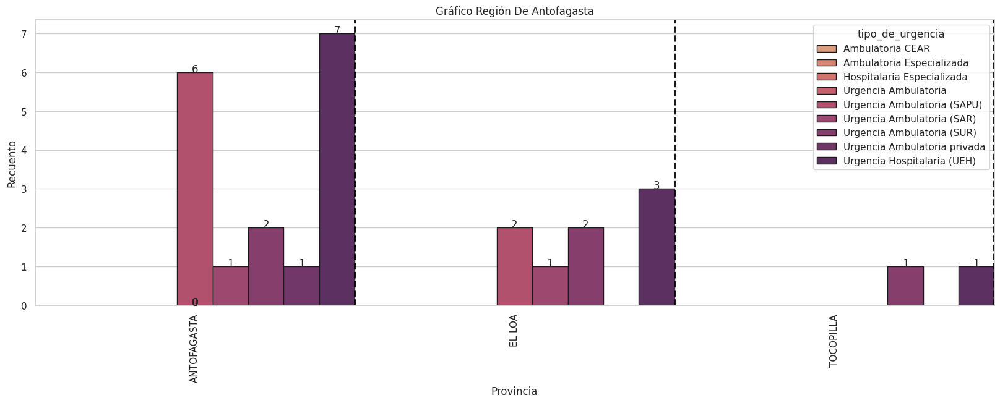

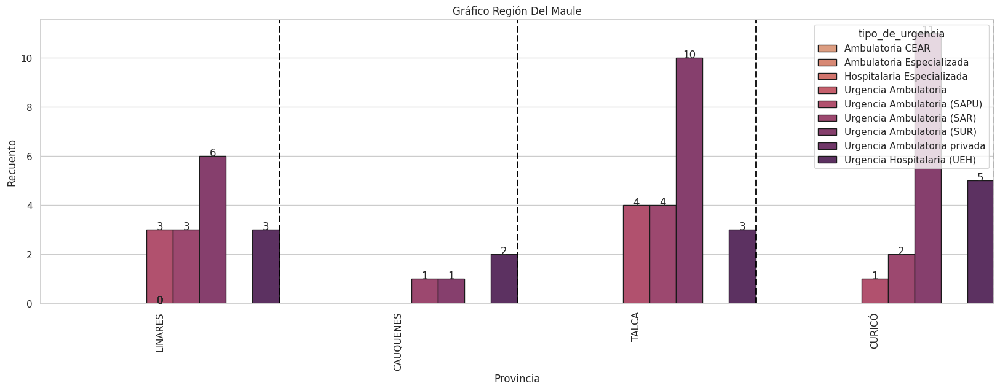

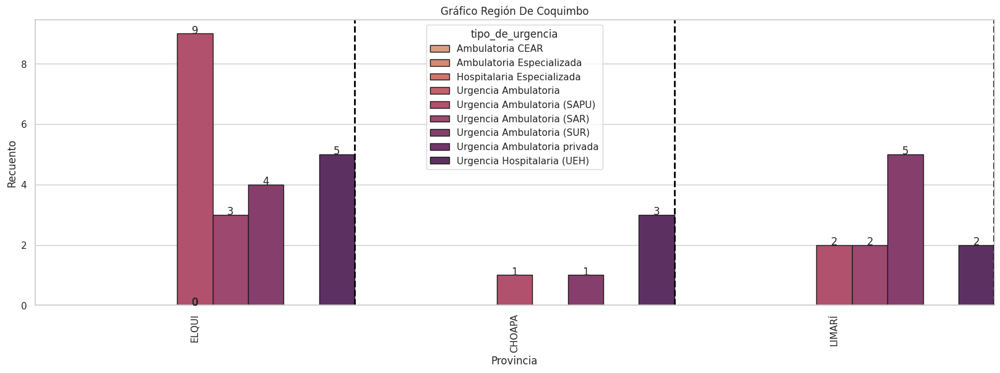

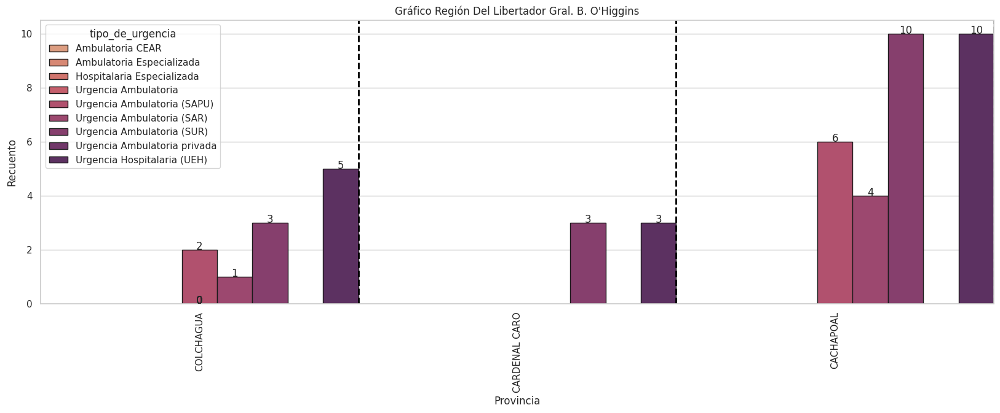

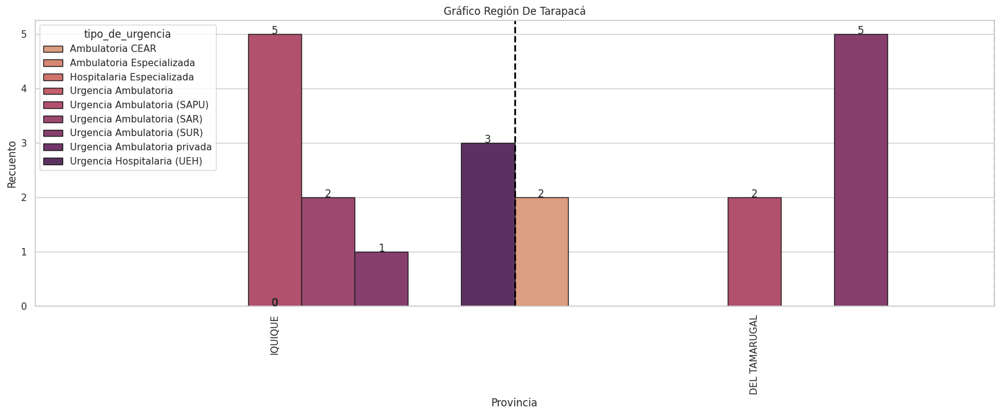

In [467]:
import matplotlib.pyplot as plt
import seaborn as sns

region_codes = df_hospitales["código_región"].unique()

# Configura el estilo de seaborn
sns.set(style="whitegrid")

# Itera sobre cada código de región
for i in region_codes:
    # Filtra el DataFrame para el código de región actual
    frame = df_hospitales[df_hospitales["código_región"] == i]
    
    # Crea un gráfico de barras
    plt.figure(figsize=(20, 6))
    ax = sns.countplot(x="nombre_provincia", data=frame, hue="tipo_de_urgencia", edgecolor="k", palette="flare", width=1)

    # Añade etiquetas a las barras
    for p in ax.patches:
        ax.annotate(f'{int(p.get_height())}', (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='baseline')

    plt.title(f'Gráfico {frame["nombre_región"].unique()[0]}')
    plt.xlabel('Provincia')
    plt.ylabel('Recuento')
    plt.xticks(rotation=90, ha="center")

    for x in range(len(frame['nombre_provincia'].unique())):
        plt.axvline(x + 0.5, color='black', linestyle='--', linewidth=2)

    plt.show()


<Figure size 2100x600 with 0 Axes>

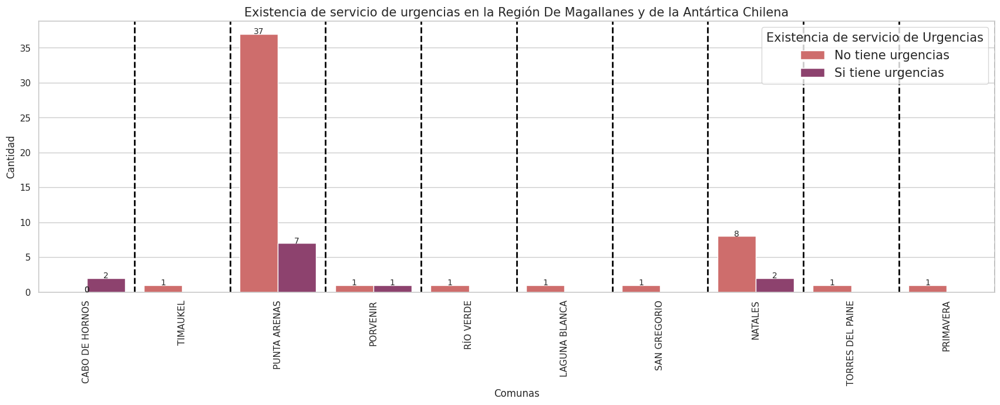

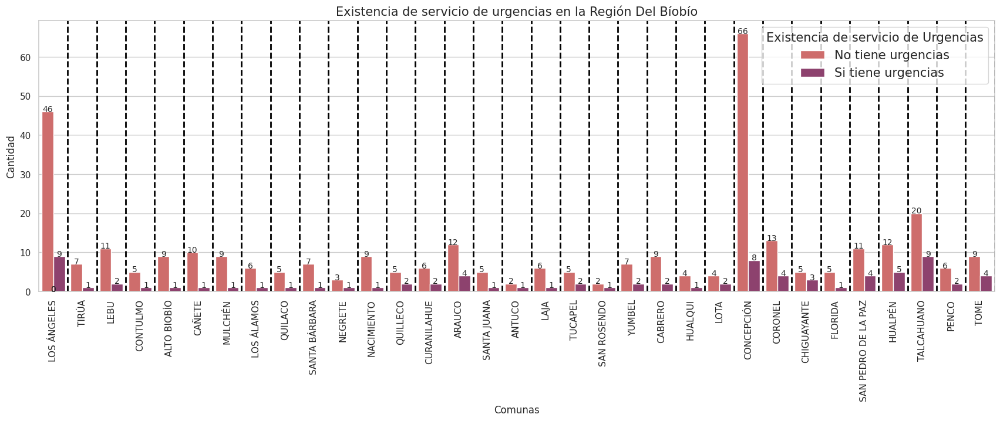

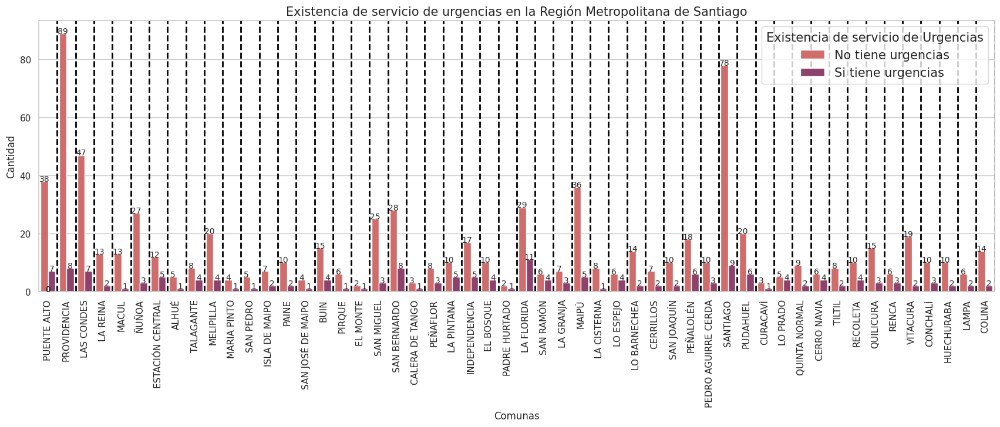

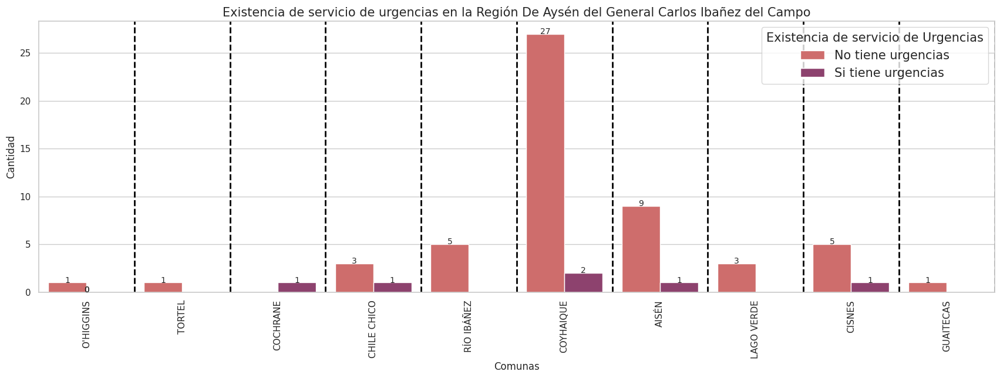

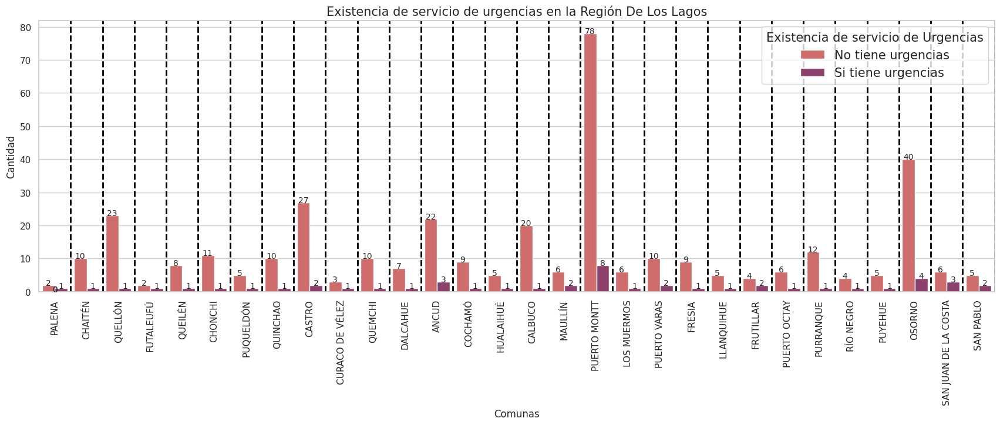

...

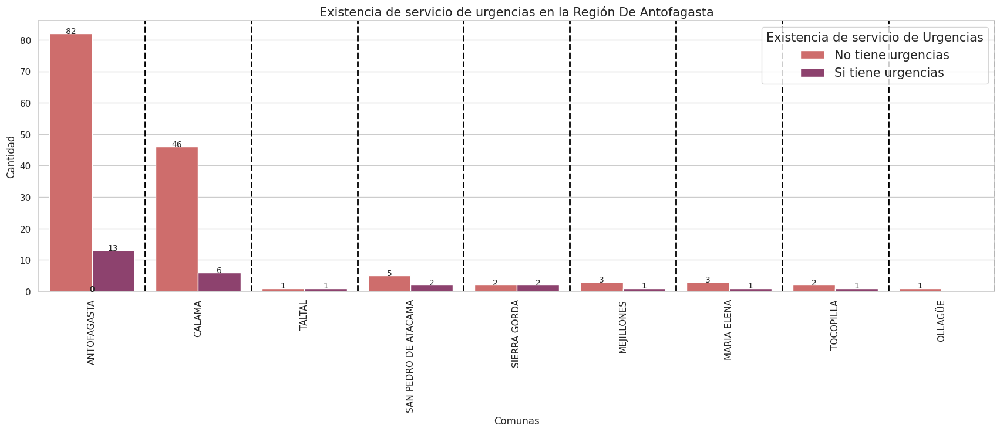

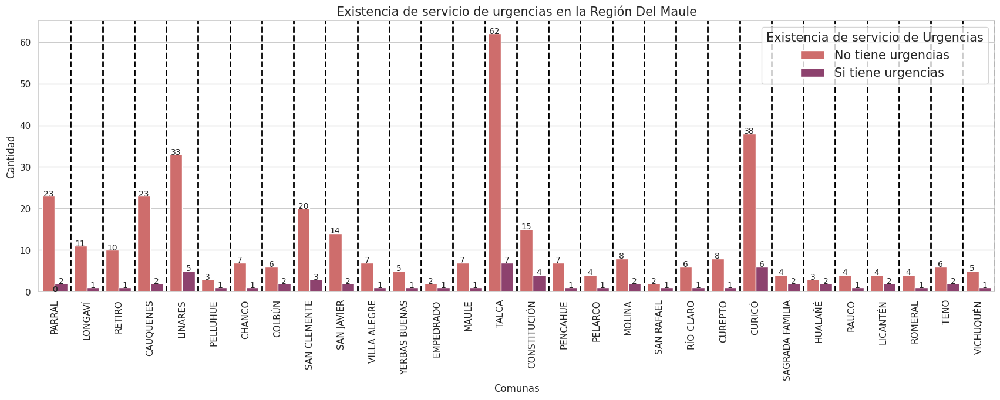

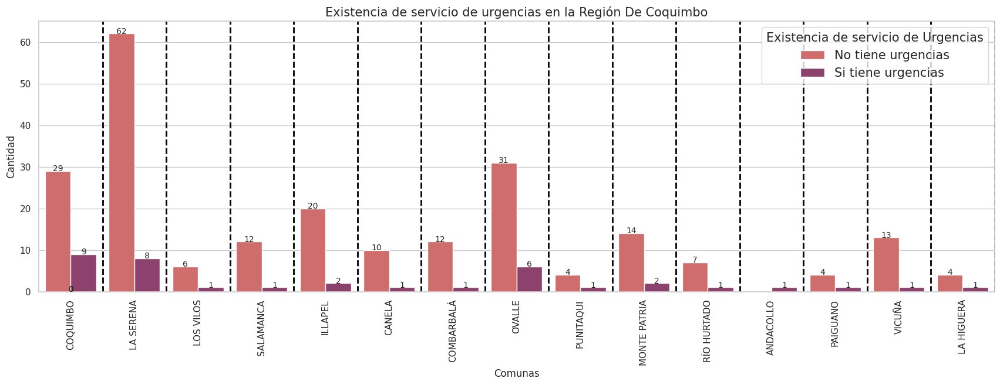

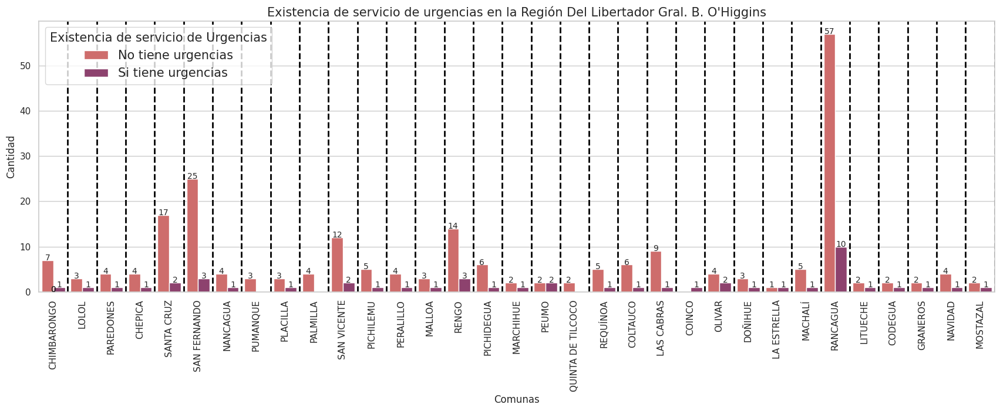

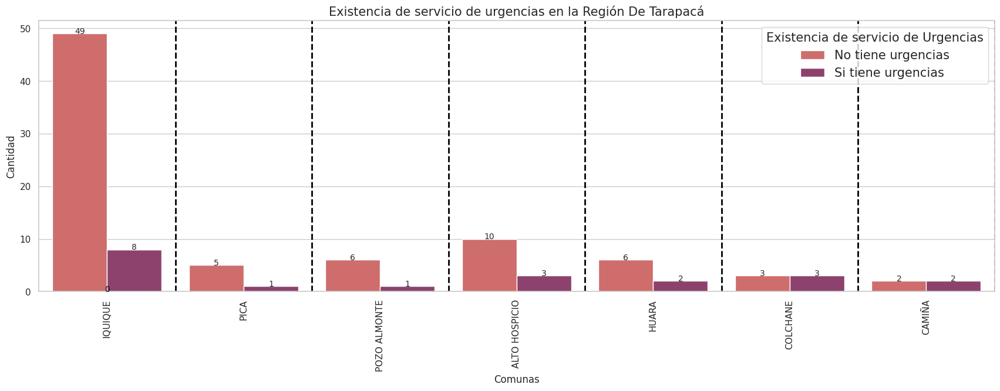

In [99]:
regiones_unicas = df_hospitales['nombre_región'].unique()  #Dataframe que permite tener la información por región sin repetición entre estas

# Establece el tamaño de la figura
plt.figure(figsize=(21, 6))

# Itera a través de las regiones y crea un gráfico para cada una
for region in regiones_unicas:
    plt.figure(figsize=(21, 6))
     #Se realiza un countplot por la existencia de categorías existencia de algún tipo de urgencia por región
    ax = sns.countplot(x="nombre_comuna", data=df_hospitales[df_hospitales['nombre_región'] == region], hue="tiene_servicio_de_urgencia", palette="flare")
    for p in ax.patches: # Iteración que permite hacer las anotaciones con los valores sobre cada barra
        ax.annotate(f'{int(p.get_height())}', (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='baseline',fontsize = "10") 
    plt.title(f'Existencia de servicio de urgencias en la {region}',fontsize = "15") #Se escoge el título del gráfico
    plt.ylabel('Cantidad') #Se nombre el eje y
    plt.xlabel('Comunas') #Se nombra el eje x 
    legend = plt.legend(["No tiene urgencias", "Si tiene urgencias"], fontsize = "15") #Se configura el cuadro resumen de los valores 
    legend.set_title("Existencia de servicio de Urgencias", prop={"size": "15"})
    for x in range(len(df_hospitales[df_hospitales['nombre_región'] == region]["nombre_comuna"].unique())):
        plt.axvline(x + 0.5, color='black', linestyle='--', linewidth=2)
    plt.xticks(rotation=90) #Se rotan la forma en que se presentan las barras del eje x 
    plt.show()
#chatgpt en annotate
#https://www.delftstack.com/es/howto/matplotlib/matplotlib-legend-title/

<Figure size 2100x600 with 0 Axes>

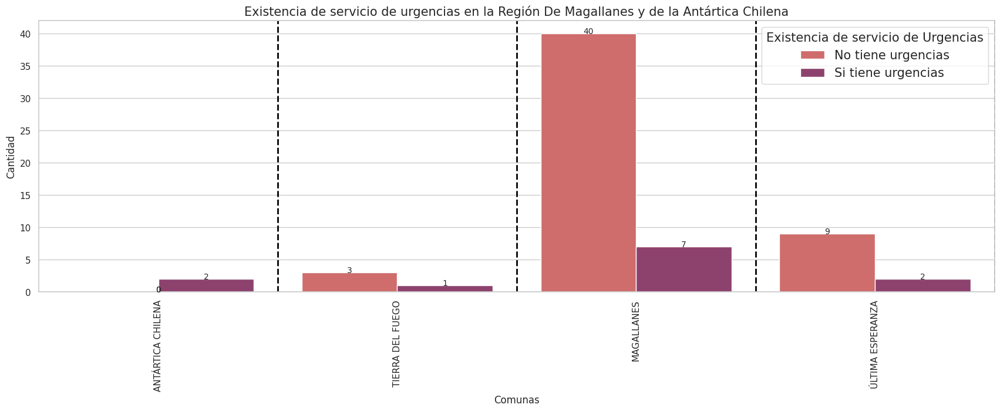

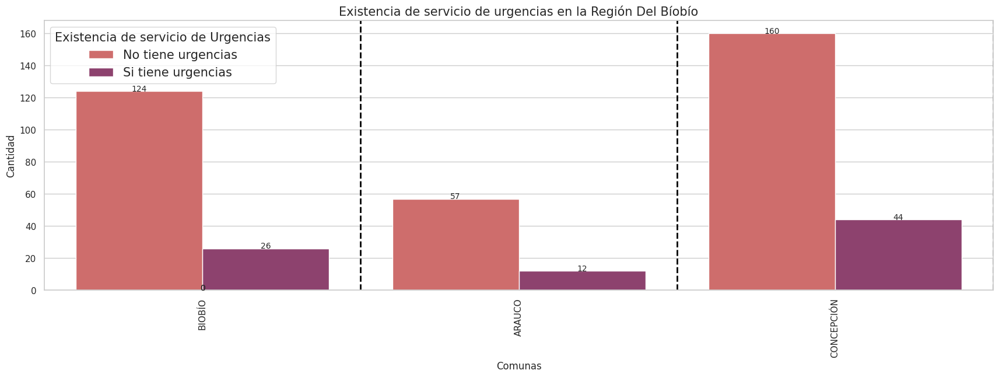

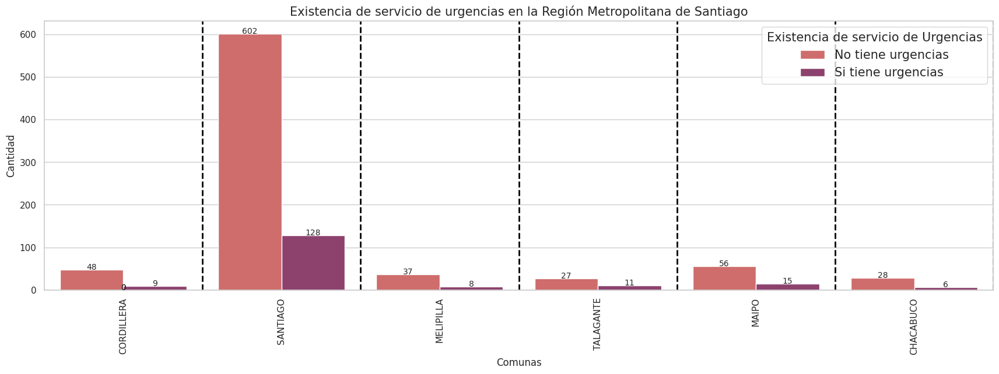

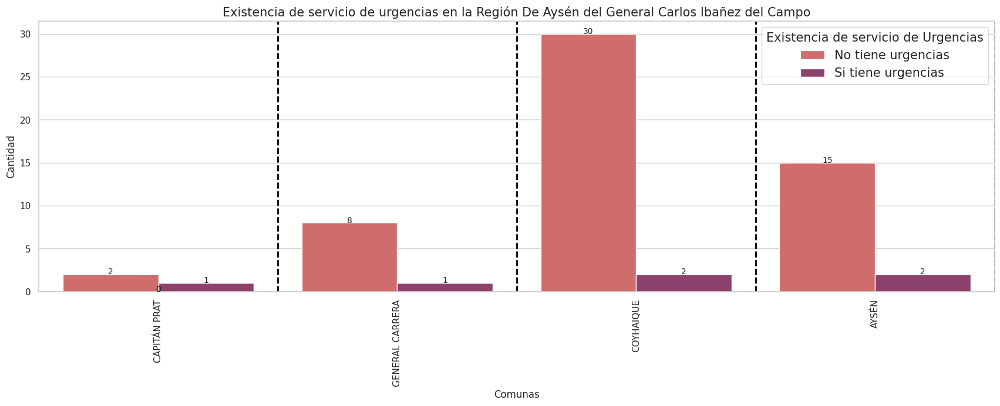

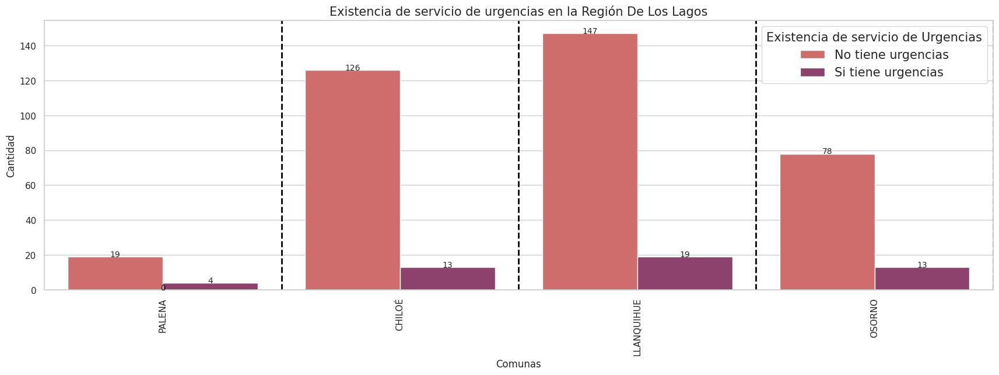

...

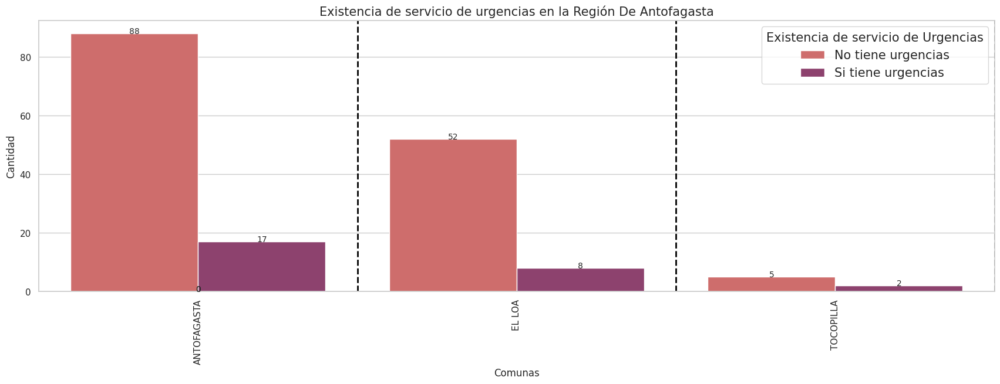

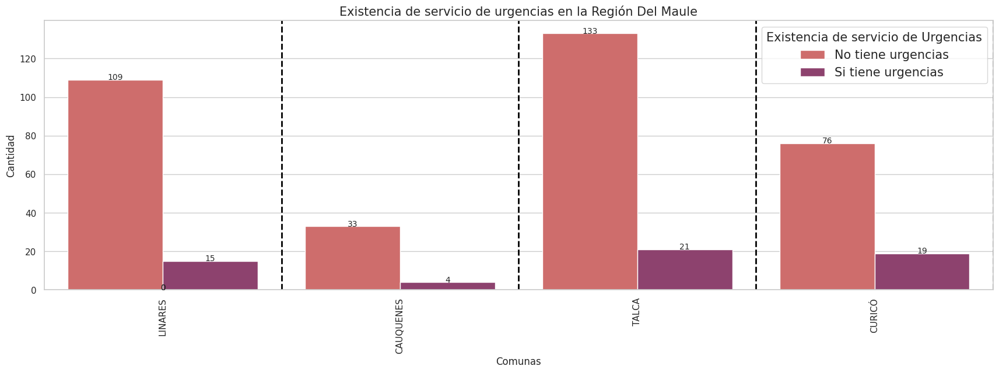

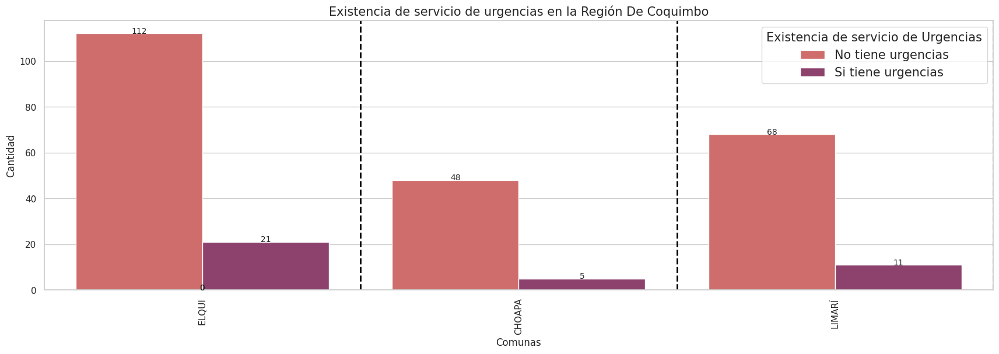

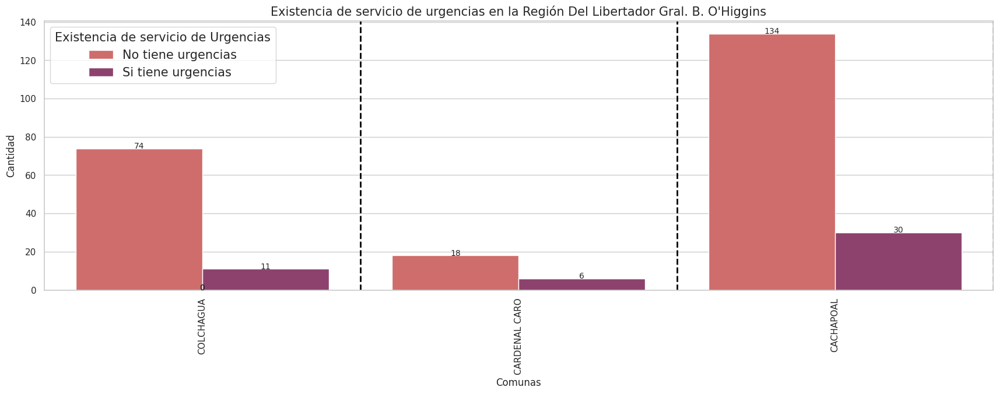

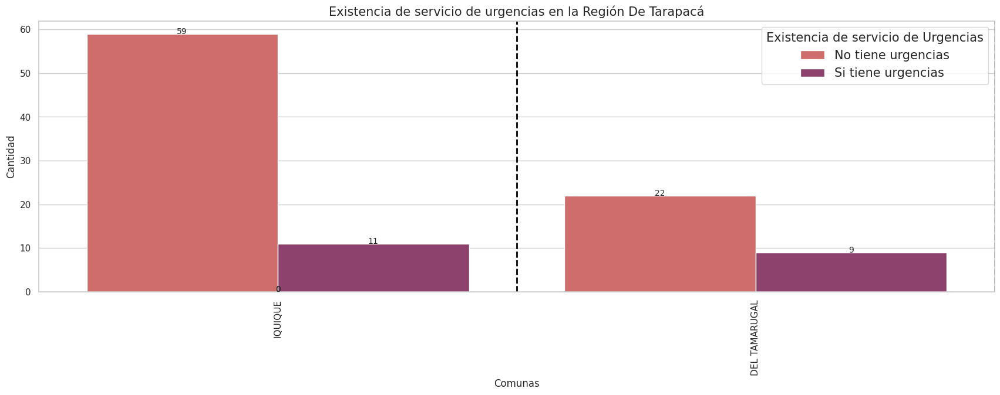

In [101]:
regiones_unicas = df_hospitales['nombre_región'].unique()  #Dataframe que permite tener la información por región sin repetición entre estas

# Establece el tamaño de la figura
plt.figure(figsize=(21, 6))

# Itera a través de las regiones y crea un gráfico para cada una
for region in regiones_unicas:
    plt.figure(figsize=(21, 6))
     #Se realiza un countplot por la existencia de categorías existencia de algún tipo de urgencia por región
    ax = sns.countplot(x="nombre_provincia", data=df_hospitales[df_hospitales['nombre_región'] == region], hue="tiene_servicio_de_urgencia", palette="flare")
    for p in ax.patches: # Iteración que permite hacer las anotaciones con los valores sobre cada barra
        ax.annotate(f'{int(p.get_height())}', (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='baseline',fontsize = "10") 
    plt.title(f'Existencia de servicio de urgencias en la {region}',fontsize = "15") #Se escoge el título del gráfico
    plt.ylabel('Cantidad') #Se nombre el eje y
    plt.xlabel('Comunas') #Se nombra el eje x 
    legend = plt.legend(["No tiene urgencias", "Si tiene urgencias"], fontsize = "15") #Se configura el cuadro resumen de los valores 
    legend.set_title("Existencia de servicio de Urgencias", prop={"size": "15"})
    for x in range(len(df_hospitales[df_hospitales['nombre_región'] == region]["nombre_provincia"].unique())):
        plt.axvline(x + 0.5, color='black', linestyle='--', linewidth=2)
    plt.xticks(rotation=90) #Se rotan la forma en que se presentan las barras del eje x 
    plt.show()
#chatgpt en annotate
#https://www.delftstack.com/es/howto/matplotlib/matplotlib-legend-title/

En la exploraicón de los datos se realizan variadas operaciones sobre los dataframes de los centro de salud a lo largo del país. 
Primeramente se trabaja en torno a la variable de exitencia de urgencias, donde el valor binario de True, False declaraba; la existencia y la no existencia de estos en una localidad específica, respectivamente. 
Por posibilidades de que hubieran zonas iguales escritas de forma diferente es que se hace con los códigos actuales únicos establecidos, sobretodo considerando que las comunas son muchas para su revisión detallada. 
Luego aquello que se extrae de este trabajo sobre los datos es lo siguiente: 

Existencia de servicio de urgencia : 
    En la contabilización global sin separación por ninguna división geográfica, la mayoría de centros médicos (todos sin separación por tipo) no tienen servicio de urgencias, predominando el valor False con 3784 entradas. Por lo tanto, solo 741 si cuentan con urgencias de cualquier tipo.  
    Luego en la búsqueda específica por región se tiene que no hay ninguna región que no tenga al menos un servicio de médico sin urgencias (de cualquier tipo).
1. Analizando los valores de todas las regiones en conjunto, la que tiene más servicios con urgencias es la Metropolitana con 177. Que a fecha de 2017 es también la con más población, 7.122.808.
1. La que tiene menos servicios de urgencia analizando todos los valores regionales en conjunto es la de Arica y Parinacota con 5. Su población a 2017 era de 226.068
1. En el porcentaje que equivale al total de centros con urgencia sobre el total de centros por cada región individual, la región con el más alto sobre las otras regiones fue Valparaíso con un 21,09%. Que tiene a 2017 una población de 1.815.902.
1. En el cálculo de porcentajes anteriores, en la región Metropolitana los centros con urgencia médica sobre su total de centros, equivale a 18,15%
1. La región con número más bajo de centros con urgencia sobre el total de centros de la región sola, comparado con las otras regiones es la región de Arica y Parinacota con 6,9%

Por provincia (dividida internamente por comuna) se observó según los gráficos que las comunas sin servicio de urgencia son : 
   1. Las Torres del Paine, en la provincia de Última Esperanza (22.686 habitantes)
   2. Timaukel y Primavera, en la provincia de Tierra del Fuego (8364 habitantes)
   3. San Gregorio, Río Verde y Laguna Blanca , en la provincia de Magallanes (133.282 habitantes)
   4. Río Ibañez, provincia de General Carrera (7531 habitantes)
   5. O´higgins y Tortel, en la provincia de Capitán Prat (4638 habitantes)
   6. Lago Verde, en la provincia de Coyhaique (58.670 habitantes)
   7. Lumaco, Ercilla, Los Sauces y Renaico, en la provincia de Malleco (205.124 habitantes)
   8. Palmilla y Pumanque, en la provincia de Colchagua (22.556 habitantes)
   9. Quinta de Tilcoco, provincia de Cachapoal (646.133 habitantes)
   10. Panquehue, provincia de San Felipe de Aconcagua (154.718 habitantes)
   11. La Cruz, provincia de Quillota (203.277 habitantes)
   12. San Esteban y Rinconada , provincia de Los Andes (110.602 habitantes)
   13. Ollague , provincia de El Loa (177.048 habitantes)
   14. General lagos, provincia de Parinacota (3449 habitantes)
   15. Camarones, provincia de Arica (22.619 habitantes)
   16. Guaitecas, provincia de Aysén (32.319 habitantes)
Hay 25 comunas que no tienen centros médicos con servicio de urgencia de cualquier tipo


Tipos de urgencia:
1. No hay ninguna región que tenga todos los tipos de urgencia 
2. Las cateogrías con cantidades más bajas son Ambulatoria Especializada (1 en Región Metropolitanan) y Urgencia Ambulatoria (1 en Región de los Lagos)
3. En total tipo de urgencia más recurrente es Urgencia Hospitalaria (UEH) con 248 recintos, le sigue Urgencia Ambulatoria (SAPU) con 234 y Urgencia Ambulatoria (SUR) con 159.
4. Las Comunas sin ningún tipo de servicio de urgencia son las mismas que no tienen urgencias pero si pueden tener centro sin este59

Existencia de servicios por complejidad:
1. Todas las regiones tienen al menos un centro de salud de alta , mediana o baja complejidad
2. Existen 290 comunas de 346 que no tienen hospitales de alta complejidad
3. Existen 206 comunas de 346 que no tiene hospitales de mediana complejidad
4. No hay comunas que no tengan hospitales de baja complejidad

### ¿Cuál es la distribución numérica y territorial de las farmacias actualmente a lo largo de Chile?

In [307]:

df_farmacias_por_comuna = df_farmacias["código_comuna"].value_counts().reset_index()
df_farmacias_por_comuna.rename(columns={"count": "cantidad_farmacias_comuna",}, inplace=True)

df_farmacias_por_prov = df_farmacias["código_provincia"].value_counts().reset_index()
df_farmacias_por_prov.rename(columns={"count": "cantidad_farmacias_prov",}, inplace=True)

df_farmacias_por_reg = df_farmacias["código_región"].value_counts().reset_index()
df_farmacias_por_reg.rename(columns={"count": "cantidad_farmacias_reg",}, inplace=True)


df_farmaias_cantidad = pd.merge(left=df_farmacias_por_comuna, right=df_poblacion_por_comuna, on="código_comuna", how="right")
df_farmaias_cantidad["cantidad_farmacias_comuna"].fillna(0, inplace=True)

df_farmaias_cantidad = pd.merge(left=df_farmaias_cantidad, right=df_farmacias_por_prov, on="código_provincia", how="left")
df_farmaias_cantidad["cantidad_farmacias_prov"].fillna(0, inplace=True)

df_farmaias_cantidad = pd.merge(left=df_farmaias_cantidad, right=df_farmacias_por_reg, on="código_región", how="left")
df_farmaias_cantidad["cantidad_farmacias_reg"].fillna(0, inplace=True)




### Existen comunas / provincias / regiones sin farmacias?

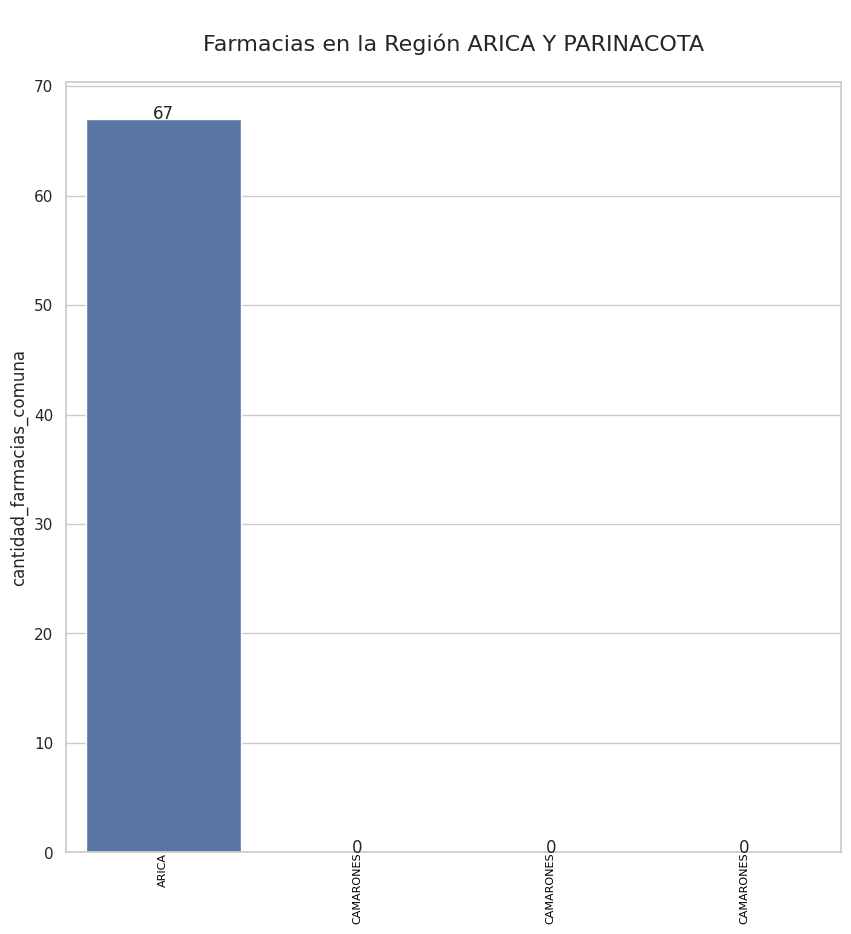

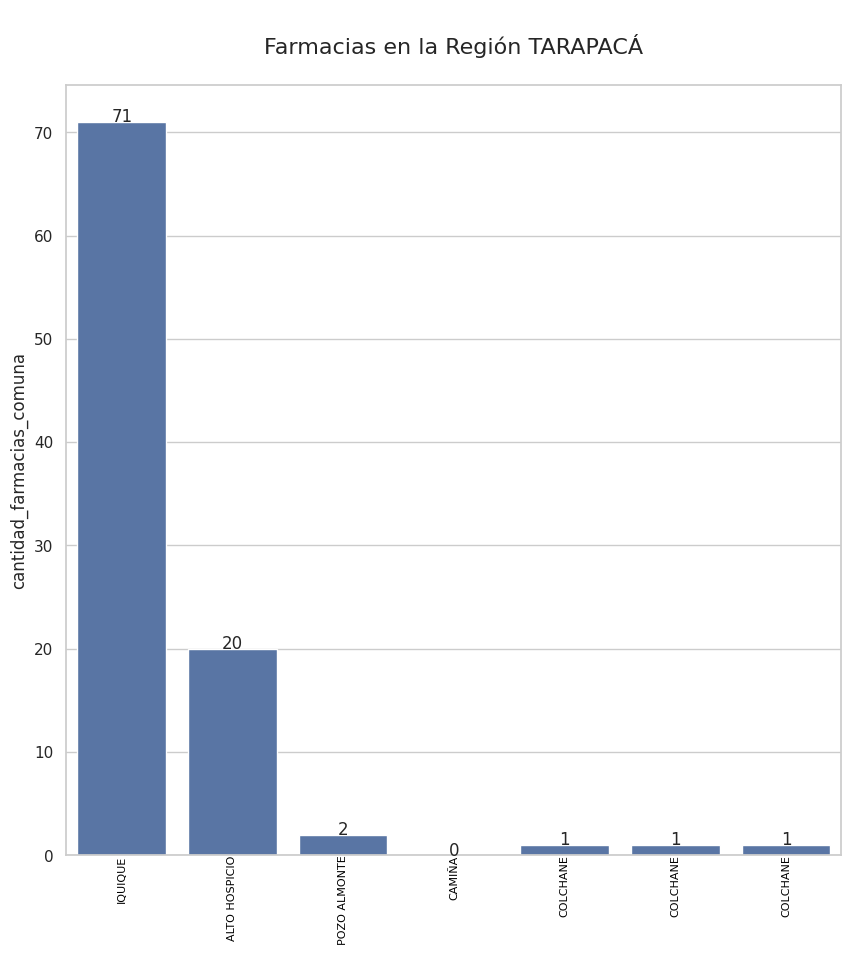

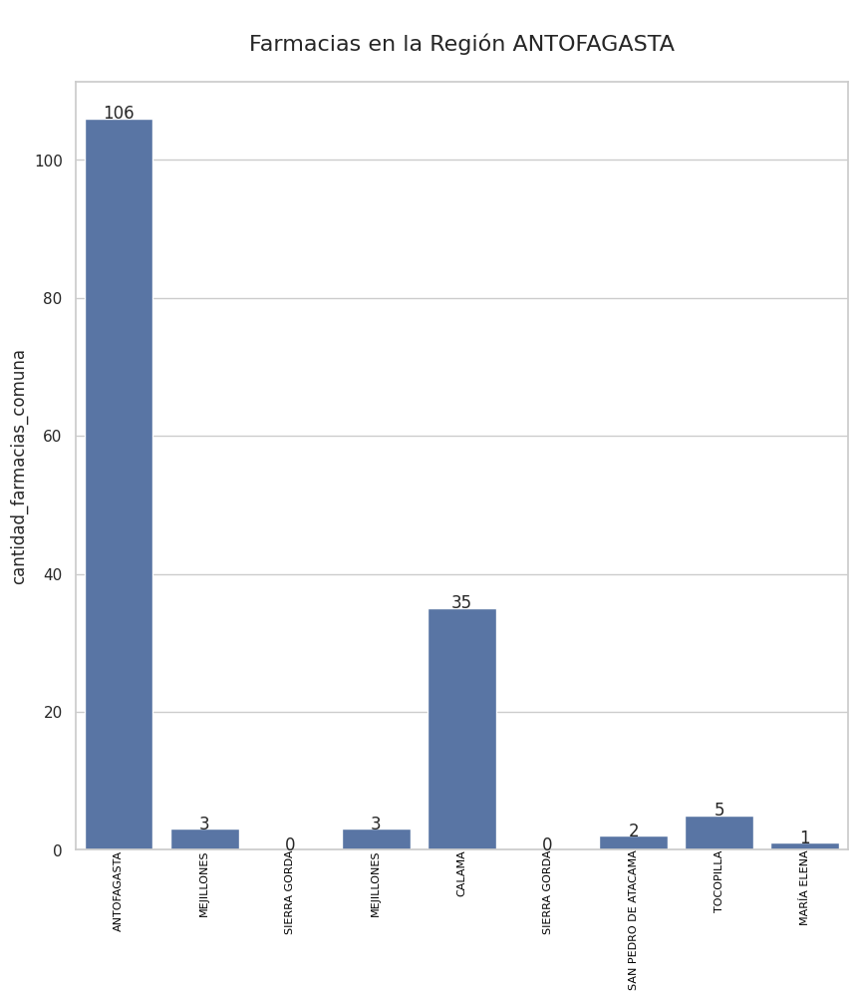

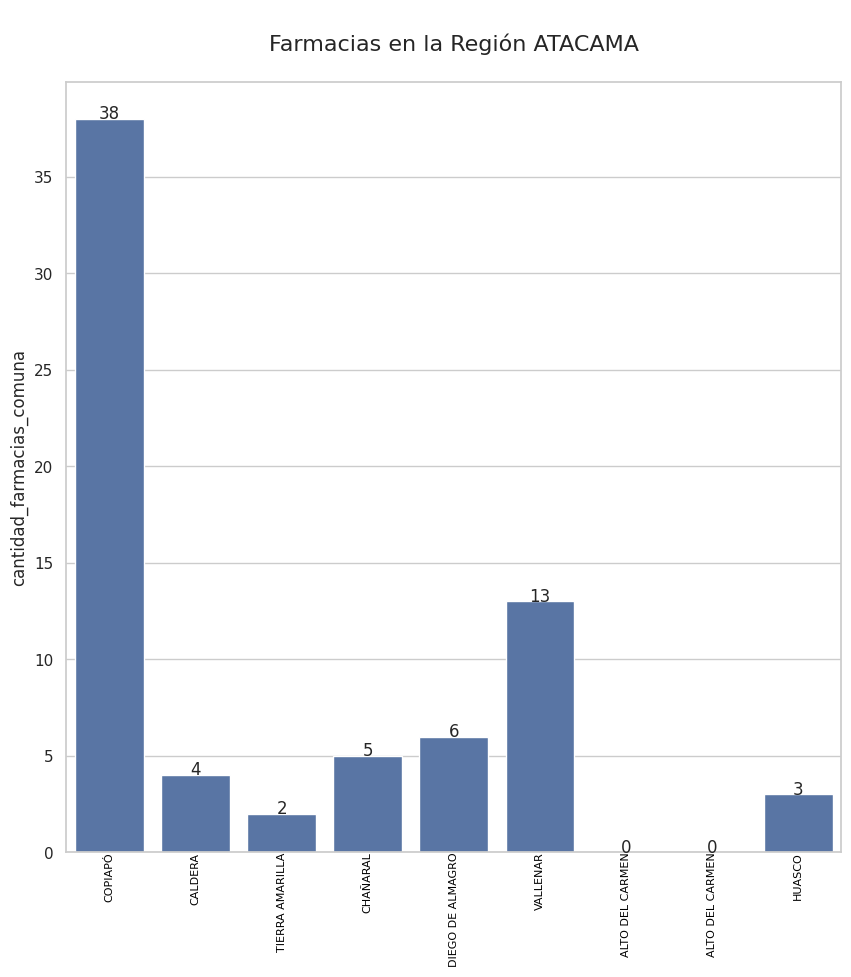

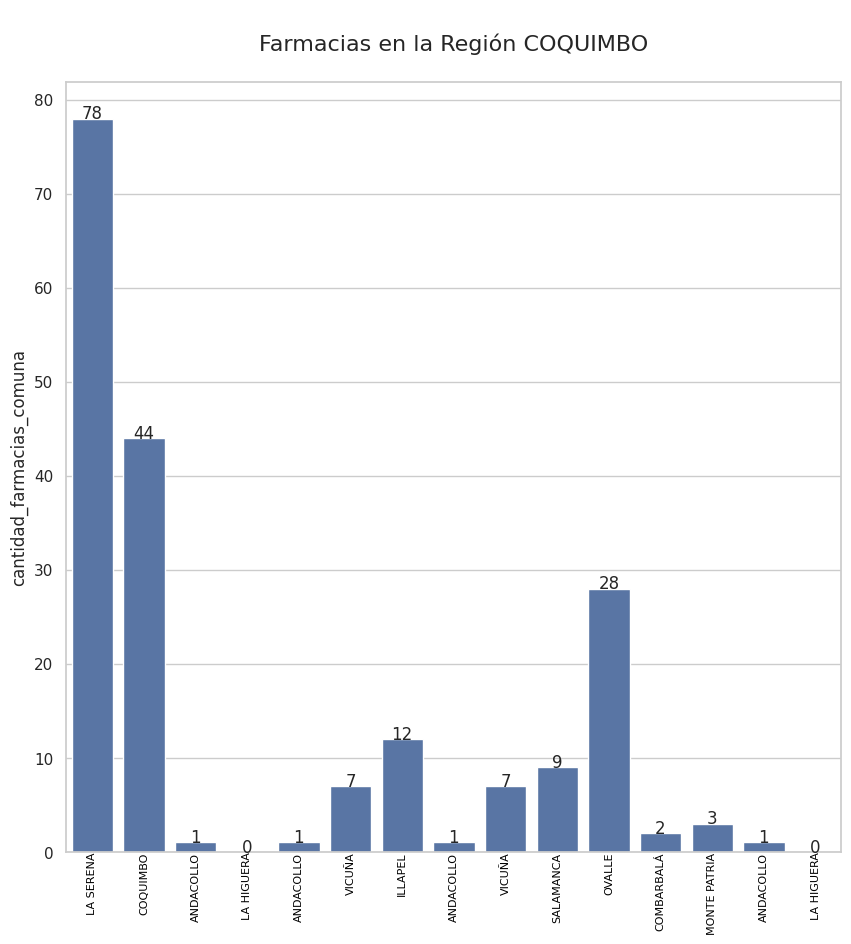

...

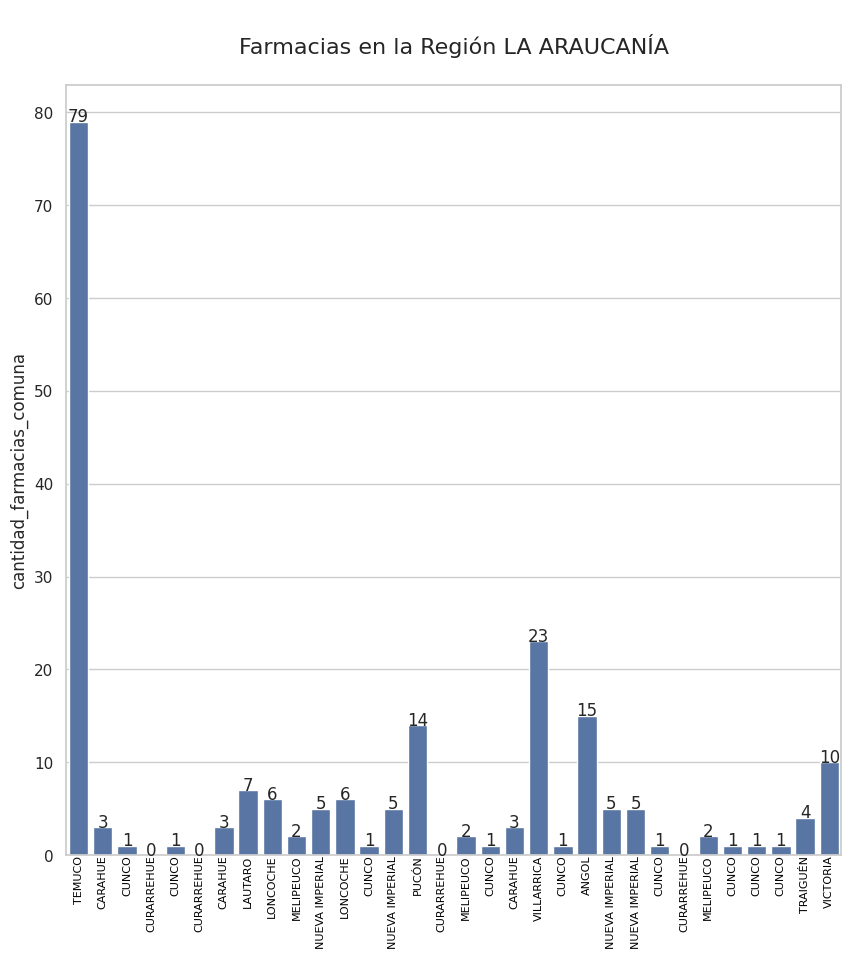

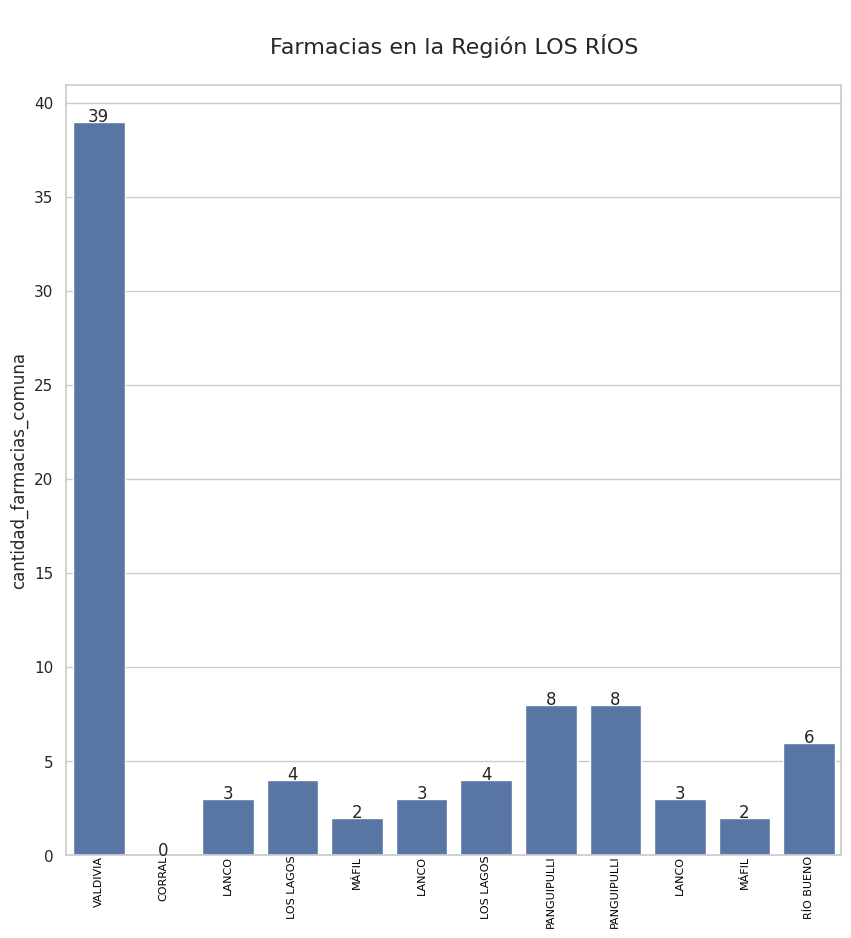

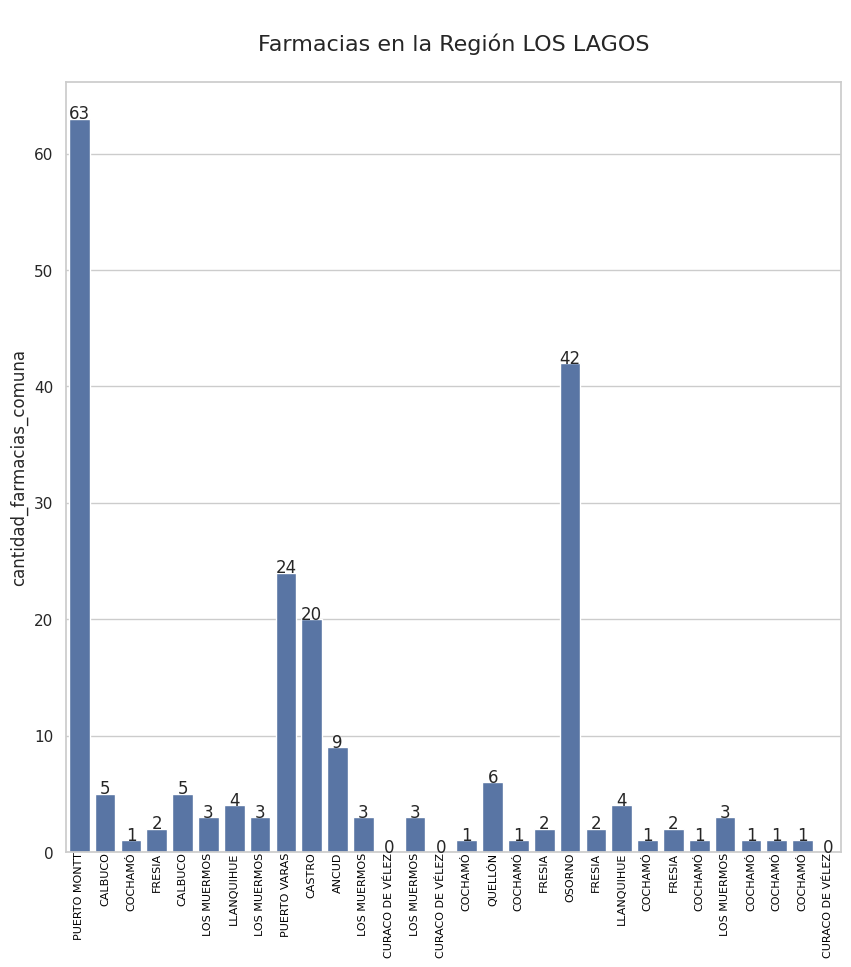

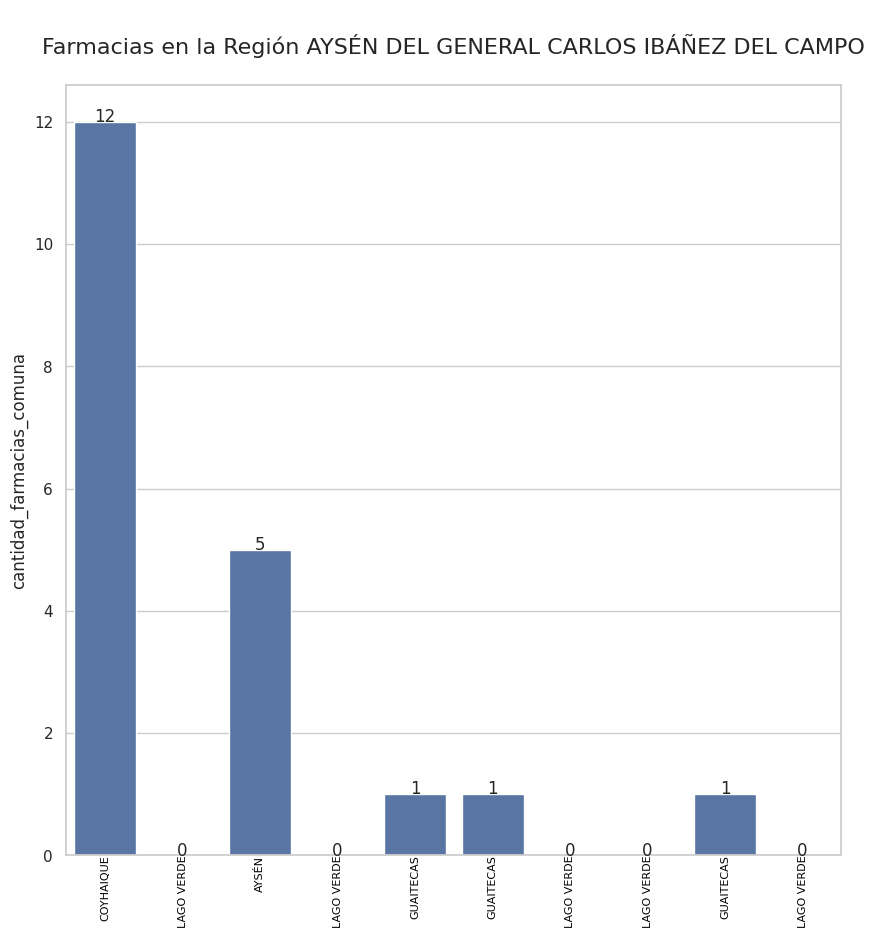

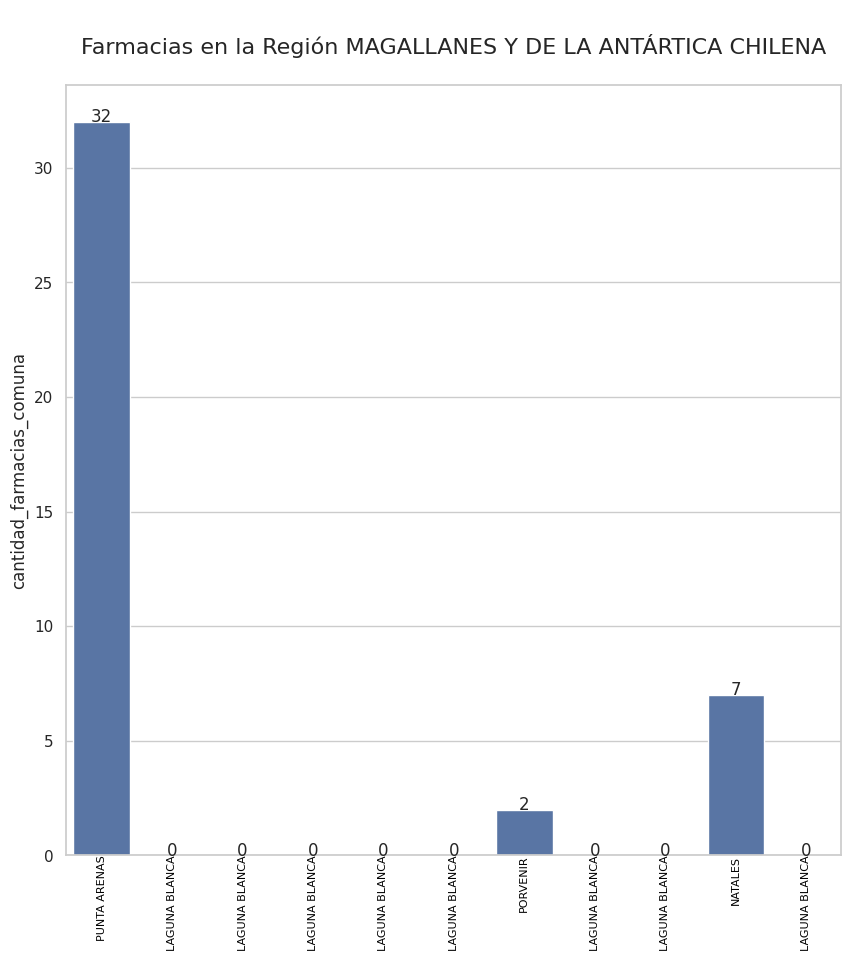

In [308]:
regiones_unicas = df_farmaias_cantidad['nombre_región'].unique()

for region in regiones_unicas:
    plt.figure(figsize=(10, 10))
    
    df_region = df_farmaias_cantidad[df_farmaias_cantidad['nombre_región'] == region]

    ax = sns.barplot(data=df_region, y="cantidad_farmacias_comuna", x="nombre_comuna", color = "purple")

    for p in ax.patches:
        ax.annotate(f'{int(p.get_height())}', (p.get_x() + p.get_width() / 2., p.get_height()),
                    ha='center', va='baseline')
        ax.annotate(df_region[df_region['cantidad_farmacias_comuna'] == p.get_height()]['nombre_comuna'].values[0],
                    (p.get_x() + p.get_width() / 2., 0),
                    ha='center', va='top', rotation=90, color='black', fontsize=8)

    plt.title(f'\nFarmacias en la Región {region}\n', fontsize=16)
    ax.xaxis.set_visible(False)
    plt.show()


In [310]:
df_farmaias_cantidad[df_farmaias_cantidad["cantidad_farmacias_prov"] == 0]

,código_comuna,cantidad_farmacias_comuna,orden,nombre_región,código_región,nombre_provincia,código_provincia,nombre_comuna,edad,hombres,mujeres,total,cantidad_farmacias_prov,cantidad_farmacias_reg
2,15201.0,0.0,66,ARICA Y PARINACOTA,15.0,PARINACOTA,152.0,PUTRE,Total Comunal,2054,711,2765,0.0,67
3,15202.0,0.0,88,ARICA Y PARINACOTA,15.0,PARINACOTA,152.0,GENERAL LAGOS,Total Comunal,412,272,684,0.0,67
339,12201.0,0.0,7480,MAGALLANES Y DE LA ANTÁRTICA CHILENA,12.0,ANTÁRTICA CHILENA,122.0,CABO DE HORNOS,Total Comunal,1195,868,2063,0.0,41
340,12202.0,0.0,7502,MAGALLANES Y DE LA ANTÁRTICA CHILENA,12.0,ANTÁRTICA CHILENA,122.0,ANTÁRTICA,Total Comunal,126,12,138,0.0,41


In [574]:
len(df_farmaias_cantidad[df_farmaias_cantidad["cantidad_farmacias_comuna"] == 0])

43

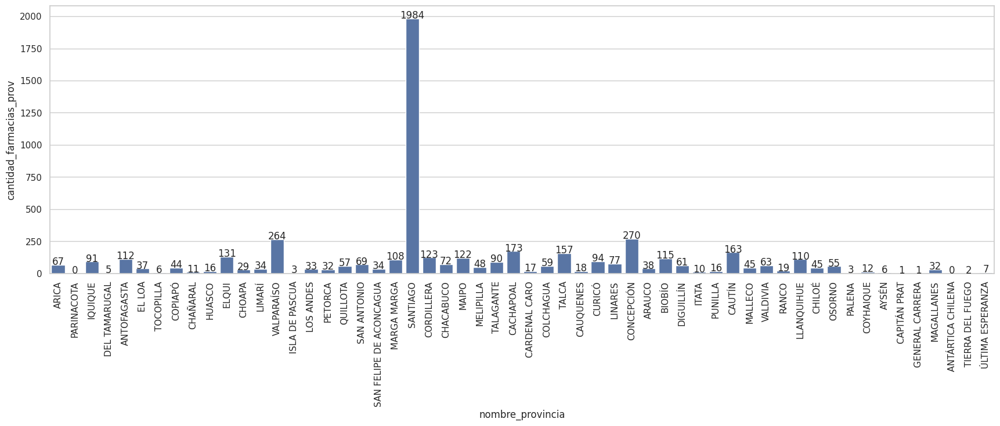

In [312]:
plt.figure(figsize=(21, 6))
ax = sns.barplot(x="nombre_provincia", y = "cantidad_farmacias_prov", data=df_farmaias_cantidad)
for p in ax.patches:
    ax.annotate(f'{int(p.get_height())}', (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='baseline')
plt.xticks(rotation=90)
plt.show()

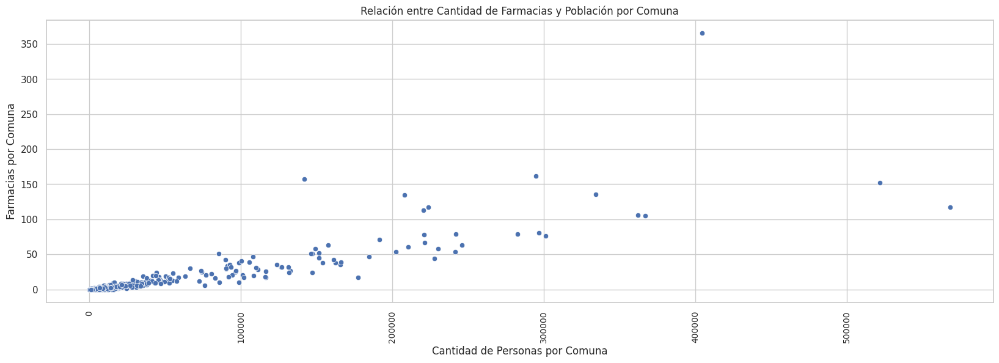

In [486]:
from matplotlib.ticker import FuncFormatter

sns.set_theme(style="whitegrid")
f, ax = plt.subplots(1, 1, figsize=(20, 6))

sns.scatterplot(data=df_farmaias_cantidad, y="cantidad_farmacias_comuna", x="total",color = "purple")

ax.set_ylabel("Farmacias por Comuna")
ax.set_xlabel("Cantidad de Personas por Comuna")
ax.set_title("Relación entre Cantidad de Farmacias y Población por Comuna")

def format_x_ticks(value, _):
    return f'{value:.0f}'

ax.xaxis.set_major_formatter(FuncFormatter(format_x_ticks))

ax.tick_params(axis='x',rotation=90, labelsize=10)

plt.show()


In [321]:
df_farmaias_cantidad[["cantidad_farmacias_comuna", "total"]].corr(numeric_only=True)

,cantidad_farmacias_comuna,total
cantidad_farmacias_comuna,1.000000,0.849409
total,0.849409,1.000000


## Respuesta
- En la mayoría de las regiones, las farmacias tienden a concentrarse en una o dos comunas, con la notable excepción de la Región Metropolitana, donde la mayoría de las comunas cuentan con una gran cantidad de farmacias. 

- La distribución numérica sugiere que, en general, la cantidad de farmacias en una comuna se correlaciona con la población de esa comuna.

- Hay 43 comunas en Chile que actualmente no cuentan con farmacias, como se muestra en el último DataFrame

## ¿Como es la variedad de acceso establecimientos privados y publicos por region y comuna?

In [351]:
df_hospitales_1.columns

Index(['código_vigente', 'código_región', 'nombre_región',
       'código_dependencia_jerárquica_(seremi_/_servicio_de_salud)',
       'nombre_dependencia_jerárquica_(seremi_/_servicio_de_salud)',
       'pertenencia_al_snss', 'tipo_establecimiento_(unidad)',
       'ámbito_de_funcionamiento', 'nombre_oficial', 'nivel_de_atención',
       'código_comuna', 'nombre_comuna', 'tiene_servicio_de_urgencia',
       'tipo_de_urgencia', 'latitud', 'longitud',
       'tipo_de_prestador_sistema_de_salud', 'nivel_de_complejidad',
       'tipo_de_atención', 'código_provincia', 'nombre_provincia'],
      dtype='object', name=0)

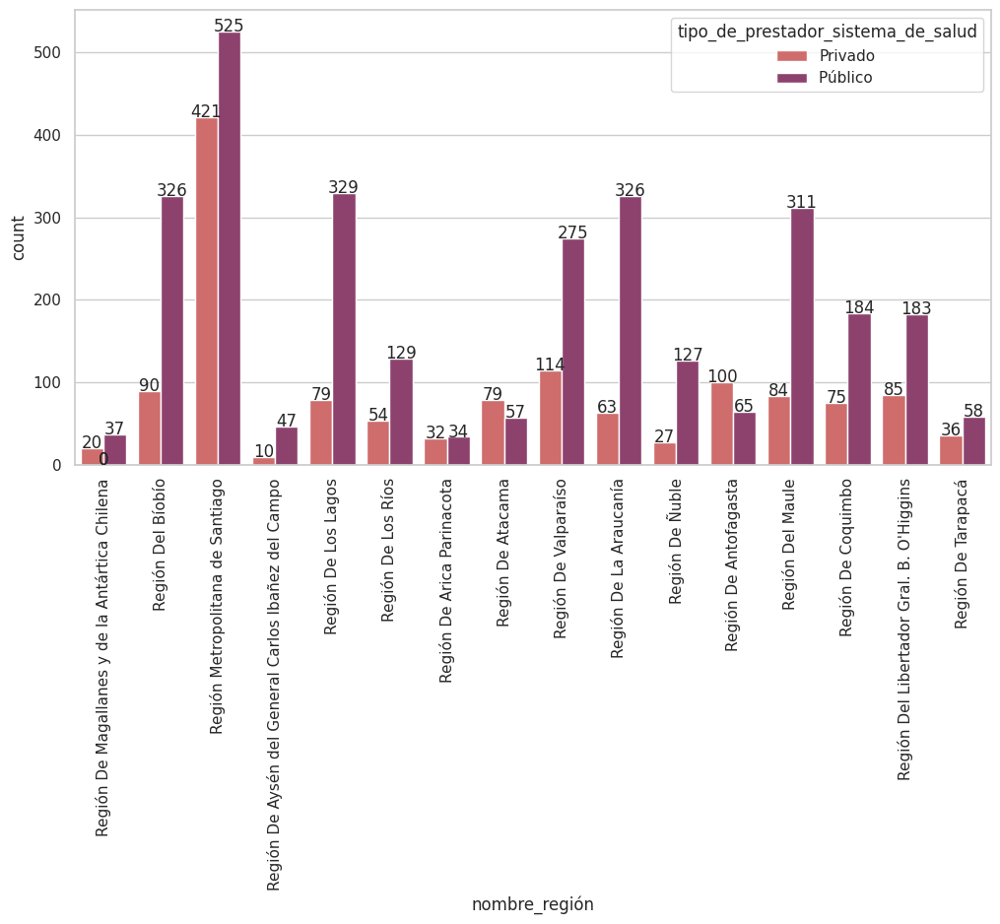

In [342]:
plt.figure(figsize=(12, 6))
ax = sns.countplot(x="nombre_región", data=df_hospitales_1, hue="tipo_de_prestador_sistema_de_salud", palette="flare")
for p in ax.patches:
    ax.annotate(f'{int(p.get_height())}', (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='baseline')
plt.xticks(rotation=90)
plt.show()

In [430]:
df_hospitales_1.columns

Index(['código_vigente', 'código_región', 'nombre_región',
       'código_dependencia_jerárquica_(seremi_/_servicio_de_salud)',
       'nombre_dependencia_jerárquica_(seremi_/_servicio_de_salud)',
       'pertenencia_al_snss', 'tipo_establecimiento_(unidad)',
       'ámbito_de_funcionamiento', 'nombre_oficial', 'nivel_de_atención',
       'código_comuna', 'nombre_comuna', 'tiene_servicio_de_urgencia',
       'tipo_de_urgencia', 'latitud', 'longitud',
       'tipo_de_prestador_sistema_de_salud', 'nivel_de_complejidad',
       'tipo_de_atención', 'código_provincia', 'nombre_provincia'],
      dtype='object', name=0)

In [478]:
cantidad_publicos_privados_comuna = pd.pivot_table(df_hospitales_1, 
                                 index='código_comuna', 
                                 columns='tipo_de_prestador_sistema_de_salud', 
                                 aggfunc='size', )

df_hospitales_poblacion_comuna_publico_privado = pd.merge(df_hospitales_poblacion_comuna, cantidad_publicos_privados_comuna, on="código_comuna")
df_hospitales_poblacion_comuna_publico_privado["diferencia_publico_menos_privado"] = df_hospitales_poblacion_comuna_publico_privado["Público "] - df_hospitales_poblacion_comuna_publico_privado["Privado"]
df_hospitales_poblacion_comuna_publico_privado.sort_values(by="diferencia_publico_menos_privado", ascending=True, inplace=True)
df_hospitales_poblacion_comuna_publico_privado["nombre_comuna"]

104     PROVIDENCIA
95       LAS CONDES
11      ANTOFAGASTA
82         SANTIAGO
20          COPIAPÓ
           ...     
258         LAUTARO
252         CARAHUE
175    SAN CLEMENTE
296         CALBUCO
216     LOS ÁNGELES
Name: nombre_comuna, Length: 345, dtype: object

In [445]:
len(df_hospitales_poblacion_comuna_publico_privado[df_hospitales_poblacion_comuna_publico_privado["diferencia_publico_menos_privado"] < 0])

26

In [463]:
len(df_hospitales_poblacion_comuna_publico_privado[df_hospitales_poblacion_comuna_publico_privado["Privado"] == 0])

204

In [466]:
len(df_hospitales_poblacion_comuna_publico_privado[df_hospitales_poblacion_comuna_publico_privado["Público "] == 0]) #Solo hay una la antartica

0

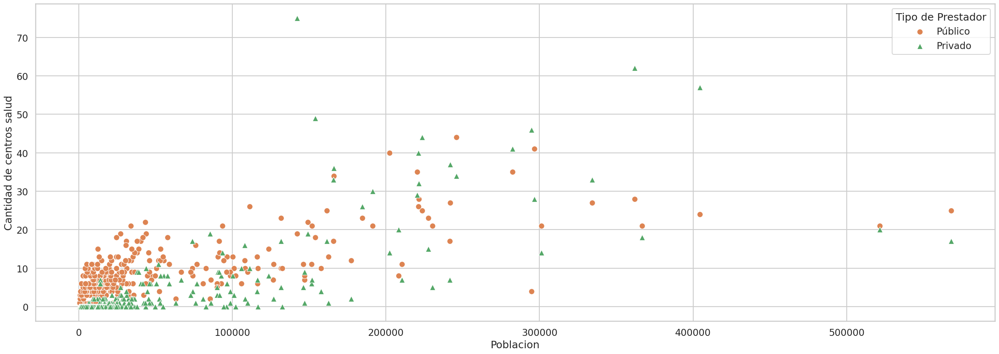

In [485]:
plt.figure(figsize=(30, 10))

sns.set(style="whitegrid")
sns.set_context("talk")

scatter_plot = sns.scatterplot(data=df_hospitales_poblacion_comuna_publico_privado, x="total", color = "purple")

scatter_plot = sns.scatterplot(data=df_hospitales_poblacion_comuna_publico_privado, y="Público ", x="total", marker='o', s=100, label='Público', color = "pink")
scatter_plot = sns.scatterplot(data=df_hospitales_poblacion_comuna_publico_privado, y="Privado", x="total",marker='^', s=100, label='Privado', color = "magenta")

plt.legend(title='Tipo de Prestador')
plt.ylabel("Cantidad de centros salud")
plt.xlabel("Poblacion")
plt.show()


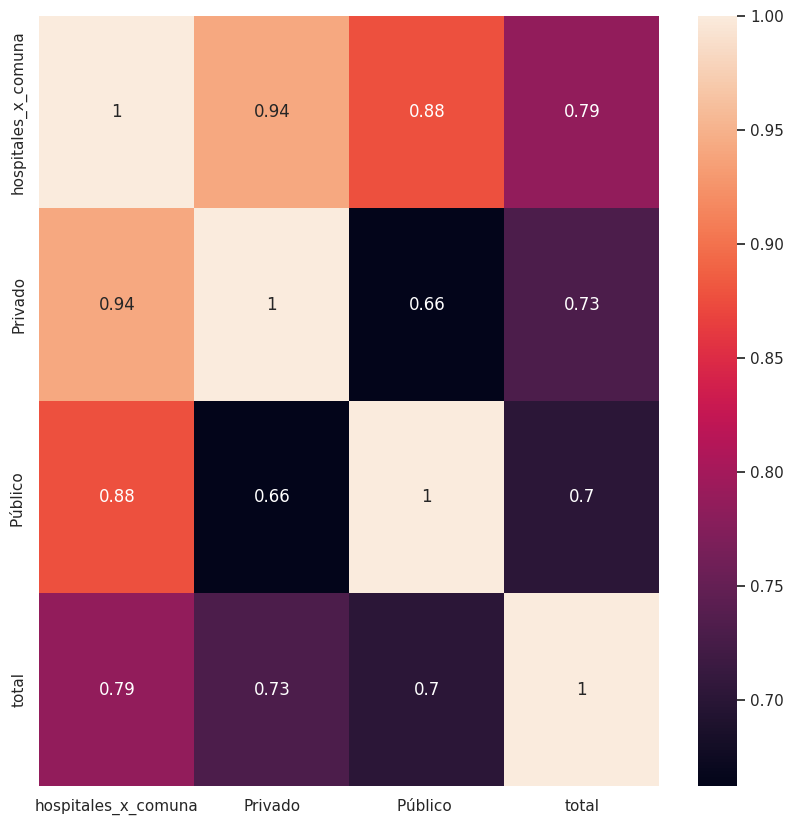

In [481]:
plt.figure(figsize=(10, 10))

sns.heatmap(df_hospitales_poblacion_comuna_publico_privado[["hospitales_x_comuna", "Privado","Público ", "total"]].corr(), annot=True)

plt.show()


Respondiendo nuestra pregunta sobre la variedad de acceso público y privado por región y comuna tenemos que: 

- En cuanto a la variedad regional existe una mayor variedad de establecimientos de acceso publico que privado exceptuando por la 1era y tercera región; donde la mayor variedad de establecimientos publicos que se encuentre en la region de la Araucanía, mientras que la mayor variedad de establecimientos privados es en la region de Antofagasta.

- En la variedad comunal existe una mayor variedad de establecimientos privados en 26 regiones donde la comuna con mayor variedad es la comuna de Providencia, con mayor variedad de establecimientos privados, mientras que la comuna de Los Ángeles posee la mayor variedad de establecimientos publicos.


## ¿Qué podría salir mal?

En el modelo de clasificaciones, podrían existir problemas en tanto al hacer la agrupación no se tiene en consideración la conformación geográfica de cada zona. Debido a que el traslado a un cluster o  dentro de un cluster es diferente dentro de cada zona, ya que puede existir o no una carretera, cerros, canales de agua, transporte público (metro/micros), etc. Factores no conocidos ahora que  determinan la accecibilidad al centro. Ello no siendo considerado en el análisis. 
Por lo tanto, para hacer un futuro análisis sobre necesidad de contrucción de servicios para clusters ya existentes o zonas fuera de estos, es que hay que tener en cuenta cuán facil es llegar a estos lugares. Además un factor importante es la cantidad de recursos económicos que hay en diferentes localidades para instalar y mantener los centros. Ya que, no porque haya más cantidad de poblaciones o más necesidad de un centro implica que existe la posibilidad de construir sin mayor aporte exteerno al existente por division territorial.

En segundo lugar los resultados encontrados respecto a cómo se ve la correlación de cantidad de población y existencia de servicios médicos/farmacias (siendo positiva), es que estos deben ser una referencia. Sin embargo, no tienen una actualización respecto a la cantidad de personas, lo que con datos actuales podría mover los gráficos y las conclusiones. Teniendo en cuenta que son datos desde hace casi 6 años y han ocurrido múltiples hechos médicos/sociales que quedan fuera en los datos utilizados.

Por otro lado, en los resultados de que hay comunas que si tienen farmacias,no se podría descartar inmediatamente que estas tengan toda la demanda de la población en esa localidad y por ende no considerar la construcción de más.
